In [15]:
import pandas as pd
from Main import settings, features, pf_set
import time
import pickle
from pandas.tseries.offsets import DateOffset
import Prepare_Data
import data_run_files
import return_prediction_functions
from return_prediction_functions import rff
import numpy as np
from pandas.tseries.offsets import MonthEnd
from sklearn.linear_model import Ridge
import General_Functions
import pickle
import Estimate_Covariance_Matrix
import os
import prepare_portfolio_data
import portfolio_choice_functions
import scipy.linalg
import matplotlib.pyplot as plt
import re
import pickle
import seaborn as sns
import cvxpy as cp
start_date = pd.to_datetime('1952-12-31')

file_path_cluster_labels = "Data/Cluster Labels.csv"
file_path_factor_details = "Data/Factor Details.xlsx"


folder_name = "much_more_data"


In [16]:
output_path = os.path.join(".", folder_name, "")
market_path = os.path.join(".", folder_name, "market_returns_test.csv")
pickle_file_path = os.path.join(".", folder_name, "model_1.pkl")
wealth_path = os.path.join(".", folder_name, "wealth.csv")
barra_file_path = os.path.join(".", folder_name, "barra_cov.pkl")
output_path_market_returns = os.path.join(folder_name, "market_returns_test.csv")

risk_free_path = os.path.join(".", folder_name, "risk_free_test.csv")
#risk_free = data_run_files.process_risk_free_rate(risk_free_path, start_date, output_path = risk_free_path)
risk_free_path = "./data_fifty/risk_free_test.csv" 
risk_free = data_run_files.process_risk_free_rate(risk_free_path, start_date)
output_data_ret_csv = os.path.join(".", folder_name, "data_ret.csv")
output_data_ret_ld1_csv = os.path.join(".", folder_name, "data_ret_ld1.csv")
daily_path = os.path.join(".", folder_name, "daily.csv")
chars_path = os.path.join(".", folder_name, "chars_behandlet.parquet")
file_path_world_ret = os.path.join(".", folder_name, "world_ret_test.csv")
daily_file_path = os.path.join(".", folder_name, "usa_dsf_test.parquet")
output_path_usa = os.path.join(".", folder_name, "usa_test.parquet")
output_path_chars_behandlet =  os.path.join(".", folder_name, "chars_behandlet.parquet")
output_path_daily = os.path.join(".", folder_name, "daily.csv")
# Paths for Data-mappen forbliver uændrede
file_path_cluster_labels = os.path.join("Data", "Cluster Labels.csv")
file_path_factor_details = os.path.join("Data", "Factor Details.xlsx")

Filtrering udført. Antal rækker efter filtrering: 841
Fil gemt som ./data_test/risk_free_test.csv


In [17]:
wealth = pd.read_csv(wealth_path)
wealth['eom'] = pd.to_datetime(wealth['eom'])
data_ret = pd.read_csv(output_data_ret_csv)
data_ret_ld1 = pd.read_csv(output_data_ret_ld1_csv)
data_ret['eom'] = pd.to_datetime(data_ret['eom'])
data_ret_ld1['eom'] = pd.to_datetime(data_ret_ld1['eom'])
data_ret_ld1['eom_ret'] = pd.to_datetime(data_ret_ld1['eom_ret'])
daily = pd.read_csv(daily_path, parse_dates=["date", "eom"])
chars = pd.read_parquet(chars_path)

#Disse er alle korrekte

In [18]:
with open(barra_file_path, "rb") as file:
    barra_cov = pickle.load(file)

In [19]:
def add_return_predictions(chars, settings, get_from_path_model):
    for h in range(1, 2):  # Hardcoded: 1 horizon
        #file_path = os.path.join(get_from_path_model, f"demeaned_model_{h}_seed10.pkl")
        file_path = os.path.join(get_from_path_model, f"model_{h}_seed10.pkl") #Normal seed - base case SR_gross = 0.98
        #file_path = os.path.join(get_from_path_model, f"model_{h}_seed5.pkl")
        #file_path = os.path.join(get_from_path_model, f"model_{h}_seed1999.pkl")
        #file_path = os.path.join(get_from_path_model, f"model_{h}_seed10_standarliseret.pkl") 
        #file_path = os.path.join(get_from_path_model, f"model_{h}_demean_standarliseret_pred_seed5.pkl")
        #file_path = os.path.join(get_from_path_model, f"model_{h}_demean_standarliseret_pred_seed1.pkl")
        with open(file_path, 'rb') as f:
            model_dict = pickle.load(f)  # Indlæs pickle-fil

        # Ekstraher og fjern den månedlige gennemsnits-dataFrame fra model_dict
 #       monthly_means_df = model_dict["monthly_means_df"]
 #       del model_dict["monthly_means_df"]

        # Iterer over dato-nøgler og udtræk forudsigelser
        all_preds = []
        for date_key, subdict in model_dict.items():
            # Antag at hver subdictionary indeholder en key "pred"
            pred_df = pd.DataFrame(subdict['pred'])
            all_preds.append(pred_df)
            
        # Saml alle forudsigelsesdata
        pred_df_all = pd.concat(all_preds, ignore_index=True)
        pred_df_all = pred_df_all[['id', 'eom', 'pred']].rename(columns={'pred': f'pred_ld{h}'})
        
        # Først merge de de-meanede forudsigelser ind i chars
        chars = chars.merge(pred_df_all, on=['id', 'eom'], how='left')
        # Dernæst merge monthly means (gennemsnitsafkast) ind i chars baseret på 'eom'
   #     chars = chars.merge(monthly_means_df, on='eom', how='left')
        # Tilføj det månedlige gennemsnitsafkast til de de-meanede *forudsigelser for at få den endelige prediction
        # Fjern eventuelt mean_ret-kolonnen, hvis du ikke behøver den
    #    chars = chars.drop(columns=['mean_ret'])
        
    return chars


In [20]:
chars = add_return_predictions(chars,settings, output_path)

lambda_list = prepare_portfolio_data.create_lambda_list(chars)

first_cov_date, hp_years, start_oos = prepare_portfolio_data.define_important_dates(barra_cov, settings)
date_ranges = prepare_portfolio_data.create_date_ranges(settings, first_cov_date, start_oos, hp_years)
dates_m1 = date_ranges["dates_m1"]
dates_m2 = date_ranges["dates_m2"]
dates_oos = date_ranges["dates_oos"]
dates_hp = date_ranges["dates_hp"]

C:\Users\jonas\anaconda3\envs\fin_econ_2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
C:\Users\jonas\anaconda3\envs\fin_econ_2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
C:\Users\jonas\anaconda3\envs\fin_econ_2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking cod

In [140]:
chars_cleaned = chars[['eom','ret_ld1', 'pred_ld1']].dropna()

In [141]:
def r2_oos(df, actual_col="ret_ld1", pred_col="pred_ld1"):
    """
    Beregner out-of-sample R^2 (R2_oos) for predictive performance.
    
    Args:
        df (pd.DataFrame): DataFrame med kolonner for faktisk og forudsagt return.
        actual_col (str): Kolonnenavn for faktisk afkast.
        pred_col (str): Kolonnenavn for forudsagt afkast.
    
    Returns:
        float: Out-of-sample R²
    """
    numerator = np.sum((df[actual_col] - df[pred_col]) ** 2)
    denominator = np.sum(df[actual_col] ** 2)

    if denominator == 0:
       return np.nan  # Undgå division med 0

    return 1 - numerator / denominator

In [142]:
from scipy.optimize import minimize_scalar
import numpy as np
import matplotlib.pyplot as plt

def optimize_q_r2(df, start_dato, slut_dato, plot=True):
    """
    Finder optimal konstant q, der maksimerer R²_oos mellem start og slutdato og laver plot.

    Args:
        df (pd.DataFrame): DataFrame med kolonner 'eom', 'ret_ld1', 'pred_ld1'
        start_dato (str): Startdato i format 'YYYY-MM-DD'
        slut_dato (str): Slutdato i format 'YYYY-MM-DD'
        plot (bool): Om der skal laves et plot af R² som funktion af q.

    Returns:
        tuple: (optimal_q, maksimeret R²)
    """
    df = df.copy()
    df["eom"] = pd.to_datetime(df["eom"])

    # Filtrér på dato
    df_period = df[(df["eom"] >= start_dato) & (df["eom"] <= slut_dato)]

    def objective(q):
        df_temp = df_period.copy()
        df_temp["pred_ld1"] = df_temp["pred_ld1"] + q
        r2 = r2_oos(df=df_temp)
        return -r2

    # Optimering
    result = minimize_scalar(objective, bounds=(-5, 5), method='bounded')
    optimal_q = result.x
    max_r2 = -result.fun

    print(f"Optimal faktor q: {optimal_q:.6f}")
    print(f"Maksimeret R²: {max_r2:.6f}")

    # Ekstra: Plot R² som funktion af q
    if plot:
        q_values = np.linspace(optimal_q - 0.01, optimal_q + 0.01, 200)
        r2_values = []

        for q in q_values:
            r2_values.append(-objective(q))  # Vi vender fortegnet igen

        plt.figure(figsize=(10,6))
        plt.plot(q_values, r2_values)
        plt.axvline(optimal_q, color='red', linestyle='--', label=f'Optimal q: {optimal_q:.4f}')
        plt.title("R²_oos som funktion af q")
        plt.xlabel("q (konstant tilføjet)")
        plt.ylabel("R²_oos")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return optimal_q, max_r2

Optimal faktor q: 0.008752
Maksimeret R²: 0.006334


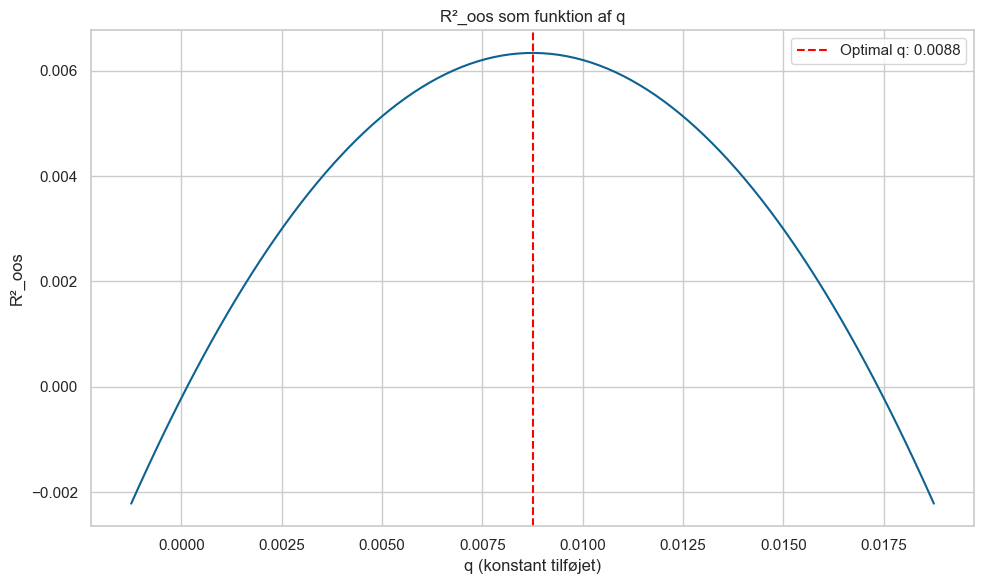

In [145]:
optimal_q, max_r2=optimize_q_r2(df=chars_cleaned, start_dato="2000-01-01", slut_dato="2010-12-31",plot=True)

In [146]:
chars["pred_ld1"] = chars["pred_ld1"] + optimal_q

In [147]:
output_folder = r"C:\Users\jonas\OneDrive\CBS\Kandidat - CBS\Speciale\Resultater Python"

In [7]:
# Hvis wealth skal æændres, så ændrer vi bare wealth_end
wealth_end_new = 1000000000 #1e9 er vores base case
end = settings["split"]["test_end"]
market_test = Prepare_Data.load_and_filter_market_returns_test(market_path)
wealth = Prepare_Data.wealth_func(wealth_end_new, end, market_test, risk_free)

Filen er indlæst og filtreret succesfuldt.


## Portfolio metrics funktioner

In [8]:
def calculate_portfolio_metrics(tpf):
    """
    Udregner porteføljens nøgletal ud fra tpf['pf']-DataFrame.
    
    Returnerer en ordbog med nøgletal:
      - r_yearly: Årligt gennemsnitligt afkast
      - std_yearly: Årlig standardafvigelse
      - SR_gross_yearly: Årlig Sharpe ratio (brutto)
      - tc_yearly: Årlige transaktionsomkostninger
      - r_tc_yearly: Årligt afkast efter transaktionsomkostninger
      - SR_net_yearly: Årlig Sharpe ratio (netto)
      - inv: Gennemsnitlig investering
      - Shorting: Gennemsnitligt shorting
      - Turnover: Gennemsnitligt turnover
    """
    pf = tpf['pf']
    r_yearly = np.mean(pf['r']) * 12
    std_yearly = pf['r'].std() * np.sqrt(12)
    SR_gross_yearly = (np.mean(pf['r']) / pf['r'].std()) * np.sqrt(12)
    tc_yearly = np.mean(pf['tc']) * 12
    r_tc_yearly = np.mean(pf['r'] - pf['tc']) * 12
    SR_net_yearly = (np.mean(pf['r'] - pf['tc']) / pf['r'].std()) * np.sqrt(12)
    inv_mean = np.mean(pf['inv'])
    shorting_mean = np.mean(pf['shorting'])
    turnover_mean = np.mean(pf['turnover'])
    
    return {
        "r_yearly": r_yearly,
        "std_yearly": std_yearly,
        "SR_gross_yearly": SR_gross_yearly,
        "tc_yearly": tc_yearly,
        "r_tc_yearly": r_tc_yearly,
        "SR_net_yearly": SR_net_yearly,
        "inv": inv_mean,
        "Shorting": shorting_mean,
        "Turnover": turnover_mean
    }

def compare_portfolio_metrics(tpf_original, tpf_new):
    """
    Sammenligner nøgletal for to porteføljer (tpf_original og tpf_new)
    og returnerer en DataFrame med kolonnerne "Metric", "Original" og "New".
    """
    metrics_orig = calculate_portfolio_metrics(tpf_original)
    metrics_new = calculate_portfolio_metrics(tpf_new)
    
    df_results = pd.DataFrame({
        "Metric": list(metrics_orig.keys()),
        "Markowitz-ML": list(metrics_orig.values()),
        "Markowitz-ML TC optimeret": list(metrics_new.values())
    })
    
    return df_results


In [9]:
def plot_specific_ids(df, id_list=None, weight_col='w', ax=None, show_legend=True):
    """
    Plotter 'weight_col' for de ID'er, der findes i id_list.
    Hvis id_list er None, plottes alle ID'er.
    Kan også plotte direkte på given matplotlib-akse (ax).
    """
    if id_list is None:
        id_list = df['id'].unique().tolist()
    
    # Filtrér til de ønskede id'er
    df_sub = df[df['id'].isin(id_list)].copy()
    df_sub = df_sub.sort_values('eom')
    
    # Pivotér så index = eom, columns = id, values = weight_col
    pivot_df = df_sub.pivot(index='eom', columns='id', values=weight_col)

    # Plot
    if ax is not None:
        pivot_df.plot(ax=ax, legend=show_legend)
        ax.set_title(f"Udvikling i {weight_col} for ID'er")
        ax.set_xlabel("Dato")
        ax.set_ylabel(weight_col)
        if show_legend:
            ax.legend(title="ID", fontsize=9)
    else:
        pivot_df.plot(figsize=(10, 6), legend=show_legend)
        plt.title(f"Udvikling i {weight_col} for ID'er")
        plt.xlabel("Dato")
        plt.ylabel(weight_col)
        if show_legend:
            plt.legend(title="ID", fontsize=9)
        plt.show()


# Markowitz optimeringen (OG version uden trade cost opt) - resultater og plots

In [151]:
#Seed 10
chars['pred_ld1']

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
            ...   
291881    0.006968
291882    0.008774
291883    0.006510
291884    0.008715
291885    0.008759
Name: pred_ld1, Length: 291886, dtype: float64

In [21]:
#Seed 10
print(chars['pred_ld1'].describe())
print(chars['pred_ld1'].isna().sum())         # Antal manglende værdier
print(chars['pred_ld1'].value_counts())       # Antal forekomster af hver værdi (hvis diskret)
print(chars['pred_ld1'].skew())               # Skævhed
print(chars['pred_ld1'].kurt())               # Kurtosis


count    181859.000000
mean          0.009979
std           0.006402
min          -0.032459
25%           0.006720
50%           0.009504
75%           0.012518
max           0.058426
Name: pred_ld1, dtype: float64
110027
pred_ld1
0.023582    1
0.012748    1
0.009982    1
0.011516    1
0.011004    1
           ..
0.006893    1
0.007045    1
0.007507    1
0.007923    1
0.010914    1
Name: count, Length: 181859, dtype: int64
0.7516360905898383
3.9944626294700583


In [51]:
#Seed 5
chars['pred_ld1']

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
            ...   
291881    0.010258
291882    0.009540
291883    0.010625
291884    0.010796
291885    0.011406
Name: pred_ld1, Length: 291886, dtype: float64

In [53]:
#Seed 5
print(chars['pred_ld1'].describe())
print(chars['pred_ld1'].isna().sum())         # Antal manglende værdier
print(chars['pred_ld1'].value_counts())       # Antal forekomster af hver værdi (hvis diskret)
print(chars['pred_ld1'].skew())               # Skævhed
print(chars['pred_ld1'].kurt())               # Kurtosis


count    181859.000000
mean          0.009766
std           0.005849
min          -0.027894
25%           0.006805
50%           0.009255
75%           0.011943
max           0.061825
Name: pred_ld1, dtype: float64
110027
pred_ld1
0.015512    1
0.013513    1
0.014636    1
0.016439    1
0.015828    1
           ..
0.008144    1
0.007360    1
0.007216    1
0.005394    1
0.011406    1
Name: count, Length: 181859, dtype: int64
0.8344036955650059
4.3279096651288995


In [103]:
pf_set["gamma_rel"]

10

In [22]:
tpf_original = portfolio_choice_functions.tpf_implement(data=chars, cov_list=barra_cov, wealth=wealth, dates=dates_oos, gam=pf_set["gamma_rel"])

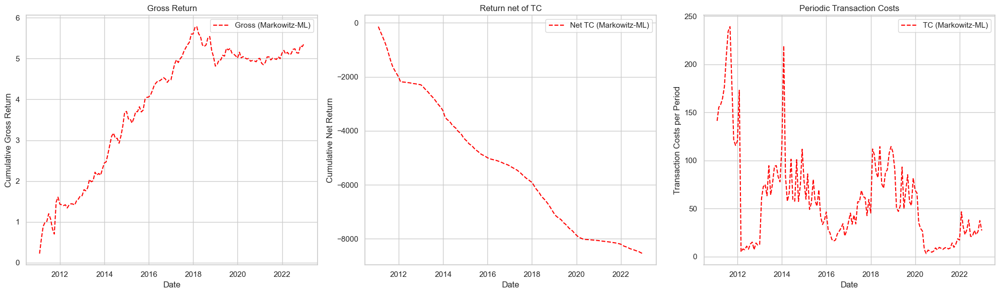

In [23]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.show()


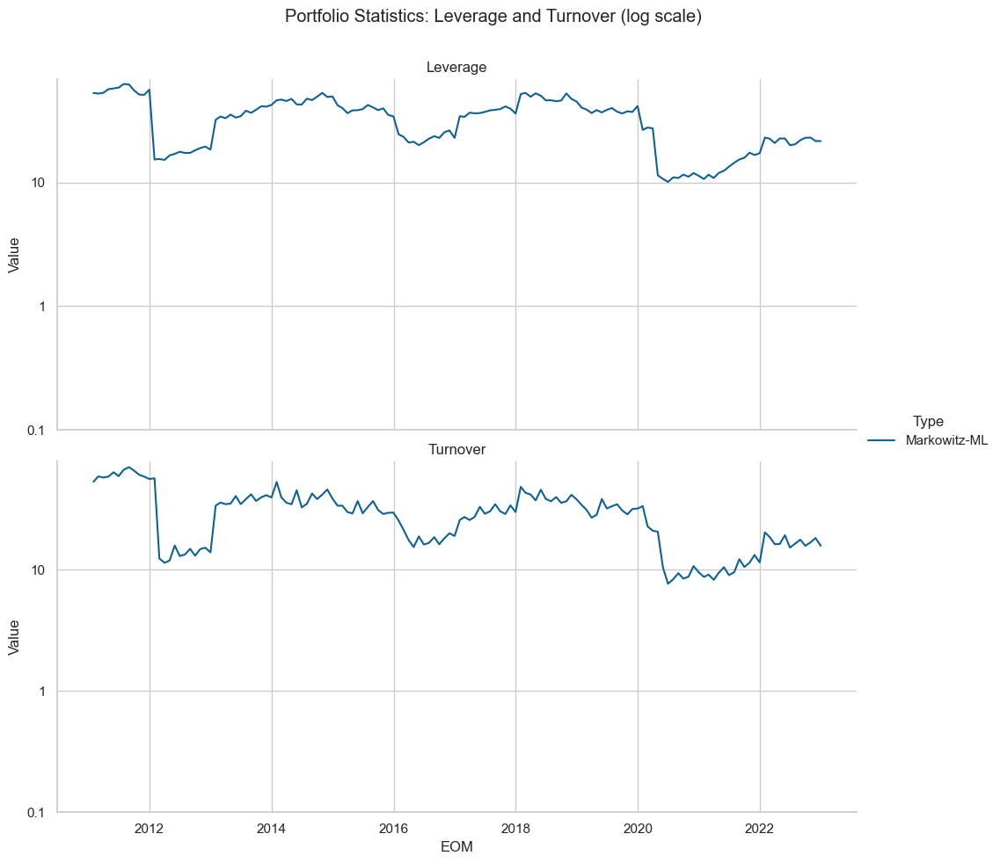

In [24]:
# 1. Kopier data for Markowitz-ML
tpf_pf = tpf_original['pf'].copy()

# 2. Sæt type-kolonnen til "Markowitz-ML"
tpf_pf["type"] = "Markowitz-ML"

# 3. Vælg de relevante kolonner: eom_ret, inv og turnover (samt type)
ws = tpf_pf[['eom_ret', 'inv', 'turnover', 'type']].copy()

# 4. Omdøb eom_ret til eom for korthed
ws.rename(columns={'eom_ret': 'eom'}, inplace=True)

# 5. Konverter til long format, så vi kan plotte Leverage og Turnover i separate paneler
ws_long = ws.melt(
    id_vars=['type', 'eom'],
    value_vars=['inv', 'turnover'],
    var_name='metric',
    value_name='value'
)

# 6. Omdøb metric-værdier til pænere navne
ws_long['metric'] = ws_long['metric'].map({
    'inv': 'Leverage',
    'turnover': 'Turnover'
})

# 7. Plot med Seaborn's FacetGrid
g = sns.FacetGrid(ws_long, col="metric", col_wrap=1, sharey=False, height=5, aspect=2)
g.map_dataframe(sns.lineplot, x="eom", y="value", hue="type", style="type")

# Sæt y-aksen til log-skala
g.set(yscale="log")

# Fjern "metric = " i facettitlen
g.set_titles("{col_name}")

# Tilføj en fælles legend
g.add_legend(title="Type")

# Angiv egne ticks på y-aksen
for ax in g.axes.flatten():
    ax.set_yticks([0.1, 1, 10])
    ax.set_yticklabels(['0.1', '1', '10'])

# Sæt akse-labels og en overordnet titel
g.set_axis_labels("EOM", "Value")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Portfolio Statistics: Leverage and Turnover (log scale)")

plt.show()


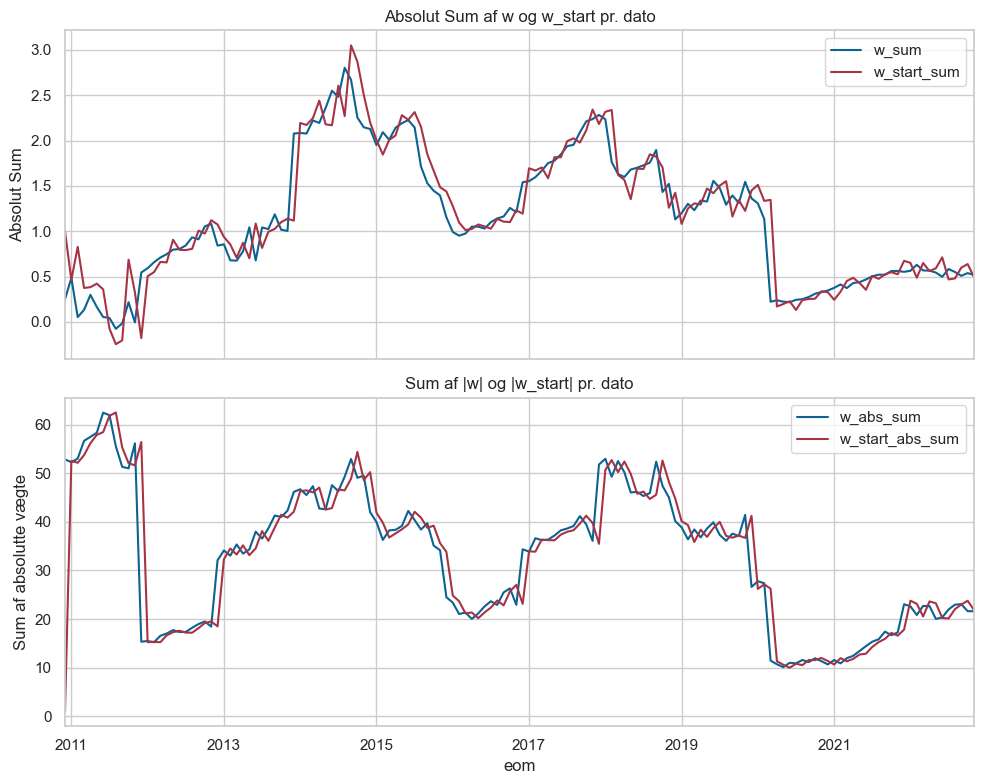

In [25]:
df = tpf_original["w"].copy()

# 1) Gruppér pr. dato (eom) og beregn sum af w, sum af w_start,
#    samt sum af |w| og sum af |w_start|
df_agg = df.groupby("eom").agg({
    "w": ["sum", lambda x: x.abs().sum()],
    "w_start": ["sum", lambda x: x.abs().sum()]
})

# 2) Giv kolonnerne mere sigende navne
df_agg.columns = ["w_sum", "w_abs_sum", "w_start_sum", "w_start_abs_sum"]

# 3) Plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot sum(w) og sum(w_start) i øverste subplot
df_agg[["w_sum", "w_start_sum"]].plot(ax=ax[0])
ax[0].set_title("Absolut Sum af w og w_start pr. dato")
ax[0].set_ylabel("Absolut Sum")

# Plot sum(|w|) og sum(|w_start|) i nederste subplot
df_agg[["w_abs_sum", "w_start_abs_sum"]].plot(ax=ax[1])
ax[1].set_title("Sum af |w| og |w_start| pr. dato")
ax[1].set_ylabel("Sum af absolutte vægte")

plt.tight_layout()
plt.show()


# Markowitz-ML med transactions cost optimering

Ny optimering med både minimering af transaktionsomkostninger samt begrænsning på de optimale vægte

In [83]:
def w_fun_qpstyle(tpf_opt, data, wealth, dates):
    """
    Genskaber logikken fra w_fun, men bruger QP-vægtene i tpf_opt.
    For hver dato t bliver w_start(t) = w_final(t-1) * (1 + tr_ld1(t-1)) / (1 + mu_ld1(t-1)).
    """
    # 1) Sikr at (id, eom) er unikke i tpf_opt
    tpf_opt = tpf_opt.drop_duplicates(subset=['id','eom'])

    # 2) For at få tr_ld1 og mu_ld1 for "forrige" dato, 
    #    laver vi merges med data og wealth, men rename eom -> eom_prev
    data_prev = data[['id','eom','tr_ld1']].drop_duplicates(subset=['id','eom'])
    data_prev = data_prev.rename(columns={'eom':'eom_prev','tr_ld1':'tr_ld1_prev'})
    
    wealth_prev = wealth[['eom','mu_ld1']].drop_duplicates(subset=['eom'])
    wealth_prev = wealth_prev.rename(columns={'eom':'eom_prev','mu_ld1':'mu_ld1_prev'})
    
    # 3) Omdøb w til w_prev og eom til eom_prev => "forrige" periodes w
    w_prev = tpf_opt.rename(columns={'w':'w_prev','eom':'eom_prev'})
    w_prev = w_prev.drop_duplicates(subset=['id','eom_prev'])

    # 4) Merge w_prev med data_prev og wealth_prev
    w_prev = pd.merge(w_prev, data_prev, on=['id','eom_prev'], how='left')
    w_prev = pd.merge(w_prev, wealth_prev, on='eom_prev', how='left')
    # Nu har w_prev kolonner: [id, eom_prev, w_prev, tr_ld1_prev, mu_ld1_prev]

    # 5) Lav en DataFrame med (eom, eom_prev) for at matche "nuværende" eom med forrige eom
    dates_df = pd.DataFrame({'eom': dates})
    dates_df['eom_prev'] = dates_df['eom'].shift(1)

    # 6) Merge tpf_opt (den "nuværende" w) med dates_df for at få eom_prev
    w_df = pd.merge(tpf_opt, dates_df, on='eom', how='left')
    # w_df har [id, eom, w, eom_prev]

    # 7) Merge w_df med w_prev (dvs. forrige måneds w + tr_ld1_prev, mu_ld1_prev)
    w_df = pd.merge(w_df, w_prev, on=['id','eom_prev'], how='left')
    # w_df har nu: [id, eom, w, eom_prev, w_prev, tr_ld1_prev, mu_ld1_prev]

    # 8) Beregn w_start for den nuværende dato:
    #    w_start(t) = w_prev(t-1) * (1 + tr_ld1_prev)/(1 + mu_ld1_prev)
    #    Hvis eom_prev er NaN (første dato), sæt w_start = np.nan eller initiel vægt
    w_df['w_start'] = w_df['w_prev'] * (1 + w_df['tr_ld1_prev']) / (1 + w_df['mu_ld1_prev'])
    #w_df['w_start'] = w_df['w_prev'] * (1 + w_df['tr_ld1']) / (1 + w_df['mu_ld1'])

    
    # For første dato i 'dates', eom_prev er NaN => w_start bliver NaN
    # Du kan fx erstatte med initiale vægte (VW) for den første dato:
    first_date = dates[0]
    init_w = General_Functions.initial_weights_new(data[data['eom'] == first_date], w_type="vw")[['id','w_start']]
    # Merge for at få init_w
    w_df = pd.merge(w_df, init_w, on='id', how='left', suffixes=('', '_init'))
    # Hvor eom == first_date, brug w_start_init
    w_df.loc[w_df['eom'] == first_date, 'w_start'] = w_df.loc[w_df['eom'] == first_date, 'w_start_init']
    missing = w_df['w_start'].isna()
    w_df.loc[missing, 'w_start'] = 0
    #w_df.loc[missing, ['tr_ld1_prev','mu_ld1_prev']] = np.nan
    #w_df['w_start'] = w_df['w_start'].fillna(0)

    # 9) Merge nu tr_ld1 og mu_ld1 for *den nuværende* dato (ikke prev) - hvis du ønsker dem i output
    # 9) Merge tr_ld1 og mu_ld1 for den forrige periode
    data_subset_shifted = data[['id','eom','tr_ld1']].drop_duplicates(subset=['id','eom'])
    data_subset_shifted = data_subset_shifted.rename(columns={'eom': 'eom_prev'})
    wealth_subset_shifted = wealth[['eom','mu_ld1']].drop_duplicates(subset=['eom'])
    wealth_subset_shifted = wealth_subset_shifted.rename(columns={'eom': 'eom_prev'})
    w_df = pd.merge(w_df, data_subset_shifted, on=['id','eom_prev'], how='left')
    w_df = pd.merge(w_df, wealth_subset_shifted, on='eom_prev', how='left')
    w_df.loc[missing, ['tr_ld1','mu_ld1']] = np.nan


    #Ændret!!!
    #w_df.loc[w_df['eom'] == first_date, ['tr_ld1', 'mu_ld1']] = np.nan

    # 10) Ryd op i kolonnerne, så vi får det endelige format
    w_df = w_df[['id','eom','w_start','w','tr_ld1','mu_ld1']]

    return w_df


In [84]:
def tpf_implement_qp(data, cov_list, wealth, dates, gam, delta, alpha):
    """
    Beregner porteføljevægte dato-for-dato med:
      - Klassisk Markowitz-ML til at finde w_opt,
      - En QP, der sikrer at w_final ligger inden for ±delta af w_opt,
      - Og som minimerer en kombineret objektfunktion:
            alpha * ||w - w_opt||^2  +  (1 - alpha) * sum(lam * (w - w_start)^2)
        hvor w_start er den afkastjusterede vægt fra forrige periode.
        
    Parametre:
      - data: DataFrame med aktiedata
      - cov_list: dictionary med kovariansmatricer (nøgle: dato)
      - wealth: DataFrame med wealth og mu_ld1 (for hver dato)
      - dates: liste over datoer
      - gam: risikoaversion parameter
      - delta: maks. afvigelse fra w_opt (f.eks. 0.2)
      - alpha: vægtning mellem at holde sig tæt på w_opt og minimere transaktionsomkostninger
      
    Returnerer:
      - tpf_opt: DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filtrer og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id', 'eom', 'me', 'tr_ld1', 'pred_ld1']]
    data_rel = data_rel.sort_values(by=['id', 'eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}

    # Helper-funktion til afkastjustering af w_prev
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)

    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    # Sørg for at gemme som Series med id som index
    w_prev_final = pd.Series(init_w['w_start'].values, index=init_w['id'])

    for d in dates:
        # Lav nøglen til cov_list
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        ids = data_sub['id'].tolist()
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values

        # 1) Beregn klassisk w_opt
        w_opt = (1 / gam) * np.linalg.solve(sigma, pred_vector)

        # 2) Juster w_prev_final for afkast
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_final, data_sub, wealth_d)

        # 3) Lav QP med kombineret objektfunktion:
        #    alpha * ||w - w_opt||^2  +  (1 - alpha)* sum(lam*(w - w_start)^2)
        lam = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(w_opt)
        n = len(w_opt)
        w = cp.Variable(n)
        obj = alpha * cp.sum_squares(w - w_opt) \
              + (1 - alpha) * cp.sum(cp.multiply(lam, cp.square(w - w_start)))
        constraints = [
            w >= w_opt - delta,
            w <= w_opt + delta
            #cp.sum(w) == 1
            # evt. tilføj w >= 0 hvis long-only ønskes
        ]
        prob = cp.Problem(cp.Minimize(obj), constraints)
        prob.solve(solver=cp.OSQP)

        if w.value is None:
            raise ValueError(f"Optimeringsproblemet for dato {d} kunne ikke løses.")
        w_final = w.value

        # 4) Gem resultater for denne dato
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = w_final
        tpf_opt_list.append(temp_df)

        # 5) Opdater w_prev_final til næste iteration som en Series med index = id
        w_prev_final = pd.Series(w_final, index=data_sub['id'])

    # Saml resultaterne
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])

    # Du kan eventuelt køre en efterfølgende funktion (w_fun_post) for yderligere behandling.
    tpf_w = w_fun_post(tpf_opt, data, wealth)
    return tpf_opt  # eller returnér en dict med både "w" og "pf"

def w_fun_post(tpf_opt, data, wealth):
    """
    Enkel version af w_fun - returnerer blot tpf_opt.
    """
    return tpf_opt


In [85]:
def run_markowitz_qp_pipeline(data, cov_list, wealth, dates, gam, delta, alpha):
    # 1) Kør QP for at få endelige vægte (med kombineret objektfunktion)
    tpf_opt = tpf_implement_qp(data, cov_list, wealth, dates, gam, delta=delta, alpha=alpha)
    
    # 2) Skab w-df med w_start, tr_ld1, mu_ld1 osv.
    tpf_w = w_fun_qpstyle(tpf_opt, data, wealth, dates)
    
    # 3) Beregn porteføljestatistikker
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    
    return {
        "w": tpf_w,
        "pf": tpf_pf
    }

# Eksempel på kald:
tpf_trans = run_markowitz_qp_pipeline(
    data=chars, 
    cov_list=barra_cov, 
    wealth=wealth, 
    dates=dates_oos, 
    gam=pf_set["gamma_rel"],
    delta=0.1,   # Sørger for, at vi ikke afviger med mere end ± delta fra w_opt
    alpha=0    # Juster alpha alt efter, hvor meget der forankres i w_opt vs. minimere TC
    #Hvis alpha = 1, så bliver løsningen så tæt den optimale portefølje uanset trade cost
    #Hvis alpha = 0, så fokuseres der udelukkende på at minimere transaktionsomkostninger
    #delta angiver hvor meget man må afvige fra de optimale vægte
    #Generelt skal vi bare holde alpha lig 0
)


# Relevante plots og stats for Original MVO vs trade cost optimeret MVO

In [154]:
df_metrics = compare_portfolio_metrics(tpf_original, tpf_trans)
display(df_metrics)
latex_table = df_metrics.to_latex(index=False, float_format="%.4f", caption="Sammenligning af porteføljemålepunkter", label="tab:portfolio_metrics")
print(latex_table)
latex_table = df_metrics.set_index("Metric").T.to_latex(
    float_format="%.4f",
    caption="Sammenligning af porteføljemålepunkter (transponeret)",
    label="tab:portfolio_metrics_transposed"
)
print(latex_table)

,Metric,Markowitz-ML,Markowitz-ML TC optimeret
0,r_yearly,0.436214,0.354901
1,std_yearly,0.419029,0.380708
2,SR_gross_yearly,1.041011,0.932211
3,tc_yearly,152.155819,9.079334
4,r_tc_yearly,-151.719605,-8.724434
5,SR_net_yearly,-362.074097,-22.916323
6,inv,39.773074,27.144528
7,Shorting,19.413358,13.291393
8,Turnover,41.534613,5.282337


\begin{table}
\caption{Sammenligning af porteføljemålepunkter}
\label{tab:portfolio_metrics}
\begin{tabular}{lrr}
\toprule
Metric & Markowitz-ML & Markowitz-ML TC optimeret \\
\midrule
r_yearly & 0.4362 & 0.3549 \\
std_yearly & 0.4190 & 0.3807 \\
SR_gross_yearly & 1.0410 & 0.9322 \\
tc_yearly & 152.1558 & 9.0793 \\
r_tc_yearly & -151.7196 & -8.7244 \\
SR_net_yearly & -362.0741 & -22.9163 \\
inv & 39.7731 & 27.1445 \\
Shorting & 19.4134 & 13.2914 \\
Turnover & 41.5346 & 5.2823 \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}
\caption{Sammenligning af porteføljemålepunkter (transponeret)}
\label{tab:portfolio_metrics_transposed}
\begin{tabular}{lrrrrrrrrr}
\toprule
Metric & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
\midrule
Markowitz-ML & 0.4362 & 0.4190 & 1.0410 & 152.1558 & -151.7196 & -362.0741 & 39.7731 & 19.4134 & 41.5346 \\
Markowitz-ML TC optimeret & 0.3549 & 0.3807 & 0.9322 & 9.0793 & -8.7244 & -22.9163

### Plot af gross return, net-return og periodisk tc (Markowitz-ML og Markowitz-ML trade cost optimized)

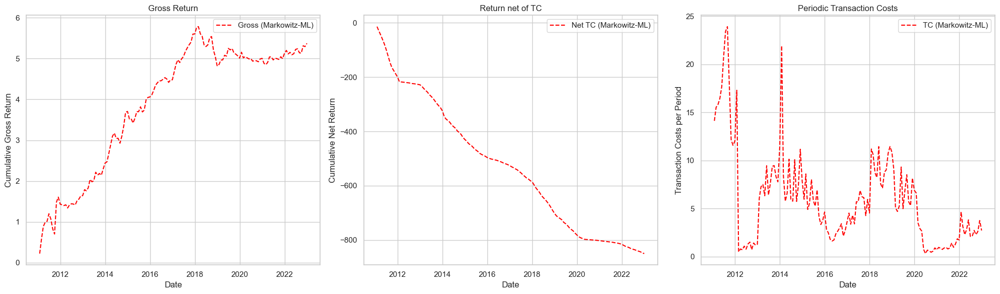

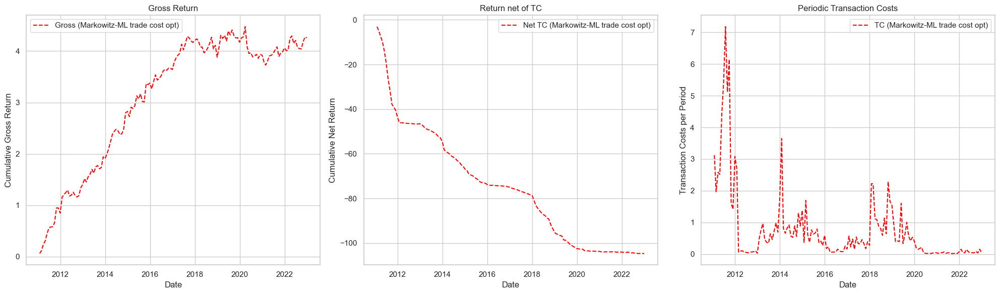

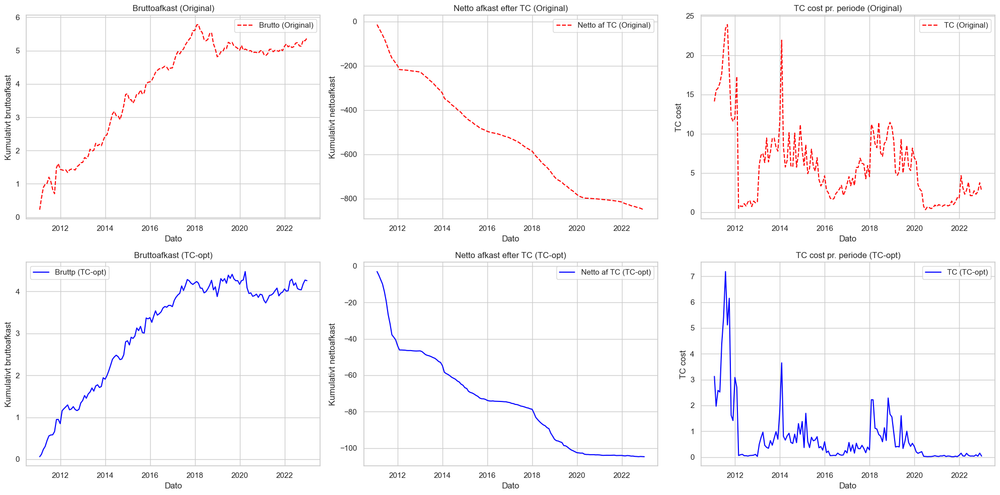

In [19]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_original.png"), dpi=300, bbox_inches='tight')
plt.show()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt.png"), dpi=300, bbox_inches='tight')
plt.show()

# Beregn kumulative afkast for begge
tpf_data = tpf_original["pf"].copy()
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans["pf"].copy()
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret samlet plot med 2 rækker (original og trade-cost-opt) og 3 kolonner
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# --- Øverste række: Original Markowitz-ML ---
axes[0, 0].plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Brutto (Original)', color='red', linestyle='--')
axes[0, 0].set_title('Bruttoafkast (Original)')
axes[0, 0].set_xlabel('Dato')
axes[0, 0].set_ylabel('Kumulativt bruttoafkast')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Netto af TC (Original)', color='red', linestyle='--')
axes[0, 1].set_title('Netto afkast efter TC (Original)')
axes[0, 1].set_xlabel('Dato')
axes[0, 1].set_ylabel('Kumulativt nettoafkast')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Original)', color='red', linestyle='--')
axes[0, 2].set_title('TC cost pr. periode (Original)')
axes[0, 2].set_xlabel('Dato')
axes[0, 2].set_ylabel('TC cost')
axes[0, 2].legend()
axes[0, 2].grid(True)

# --- Nederste række: Trade Cost Optimeret ---
axes[1, 0].plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Bruttp (TC-opt)', color='blue', linestyle='-')
axes[1, 0].set_title('Bruttoafkast (TC-opt)')
axes[1, 0].set_xlabel('Dato')
axes[1, 0].set_ylabel('Kumulativt bruttoafkast')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Netto af TC (TC-opt)', color='blue', linestyle='-')
axes[1, 1].set_title('Netto afkast efter TC (TC-opt)')
axes[1, 1].set_xlabel('Dato')
axes[1, 1].set_ylabel('Kumulativt nettoafkast')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[1, 2].plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (TC-opt)', color='blue', linestyle='-')
axes[1, 2].set_title('TC cost pr. periode (TC-opt)')
axes[1, 2].set_xlabel('Dato')
axes[1, 2].set_ylabel('TC cost')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Fælles layout og gem
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt_combined_delta_0.1.png"), dpi=300, bbox_inches='tight')

### Udvikling af vægte over tid for original Markowitz vs trade cost optimeret Markowitz

In [20]:
def plot_specific_ids(df, id_list=None, weight_col='w', ax=None, show_legend=True):
    """
    Plotter 'weight_col' for de ID'er, der findes i id_list.
    Hvis id_list er None, plottes alle ID'er.
    Kan også plotte direkte på given matplotlib-akse (ax).
    """
    if id_list is None:
        id_list = df['id'].unique().tolist()
    
    # Filtrér til de ønskede id'er
    df_sub = df[df['id'].isin(id_list)].copy()
    df_sub = df_sub.sort_values('eom')
    
    # Pivotér så index = eom, columns = id, values = weight_col
    pivot_df = df_sub.pivot(index='eom', columns='id', values=weight_col)

    # Plot
    if ax is not None:
        pivot_df.plot(ax=ax, legend=show_legend)
        ax.set_title(f"Udvikling i {weight_col} for ID'er")
        ax.set_xlabel("Dato")
        ax.set_ylabel(weight_col)
        if show_legend:
            ax.legend(title="ID", fontsize=9)
    else:
        pivot_df.plot(figsize=(10, 6), legend=show_legend)
        plt.title(f"Udvikling i {weight_col} for ID'er")
        plt.xlabel("Dato")
        plt.ylabel(weight_col)
        if show_legend:
            plt.legend(title="ID", fontsize=9)
        plt.show()


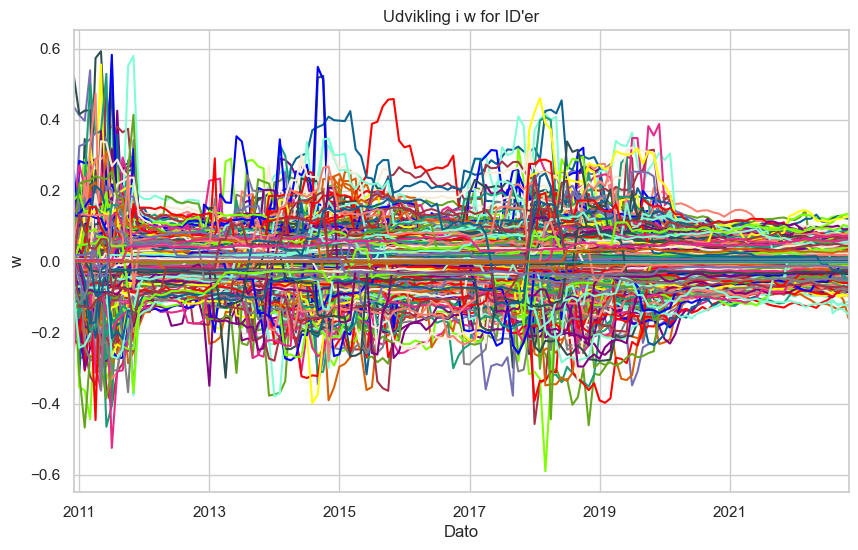

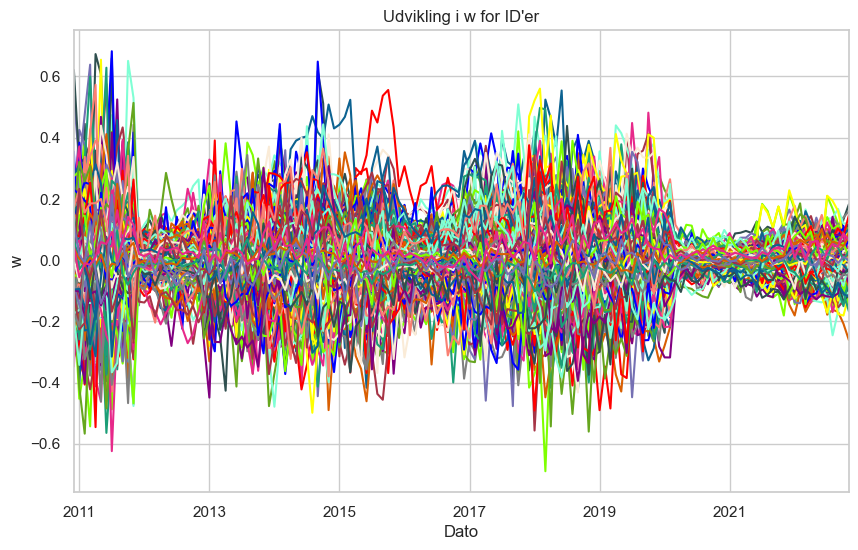

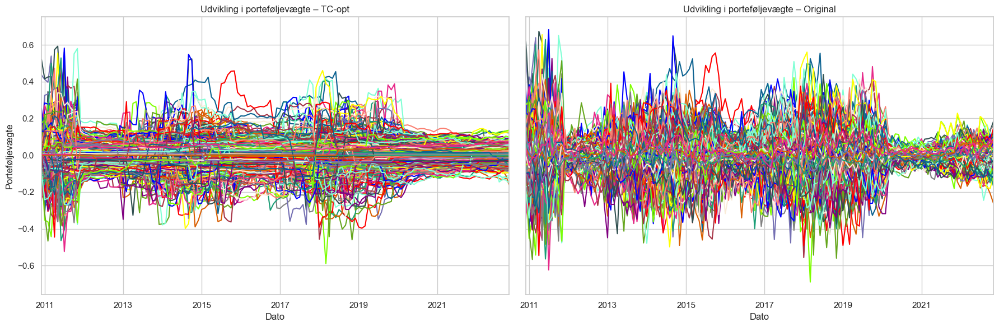

In [21]:
plot_specific_ids(tpf_trans["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_original["w"], id_list=None, weight_col='w', show_legend=False)
# Opret side-by-side subplot
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_trans["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i porteføljevægte – TC-opt")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("Porteføljevægte")

# Plot tpf_original
plot_specific_ids(tpf_original["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i porteføljevægte – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt"), dpi=300, bbox_inches='tight')
plt.show()

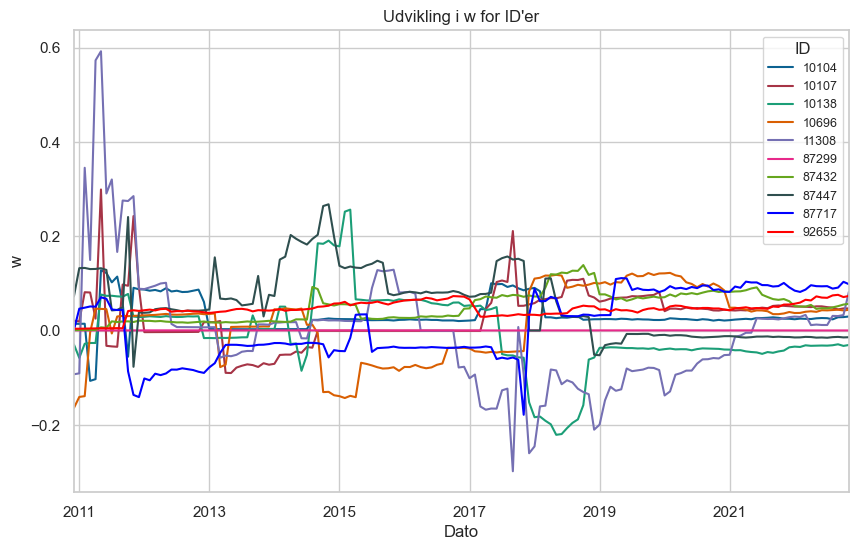

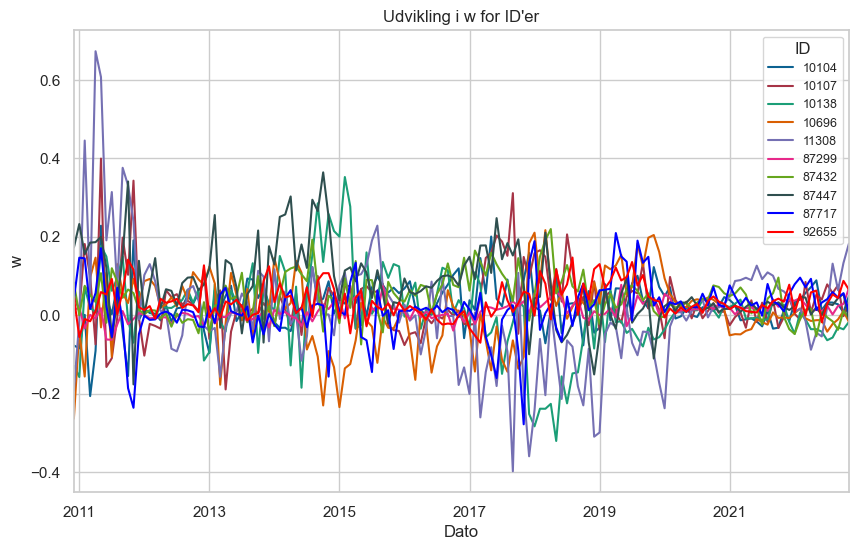

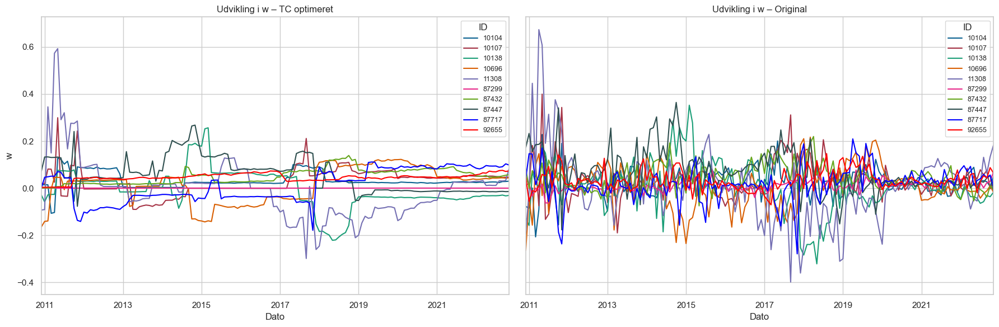

In [22]:
my_ids = [10104, 10107, 10138, 10696, 11308, 87299, 87432, 87447, 87717, 92655]
plot_specific_ids(tpf_trans["w"], my_ids, weight_col='w') 
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w')  

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot TC-optimeret
plot_specific_ids(tpf_trans["w"], my_ids, weight_col='w', ax=axes[0], show_legend=True)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot original
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w', ax=axes[1], show_legend=True)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt_udvalgte.png"), dpi=300, bbox_inches='tight')
plt.show()


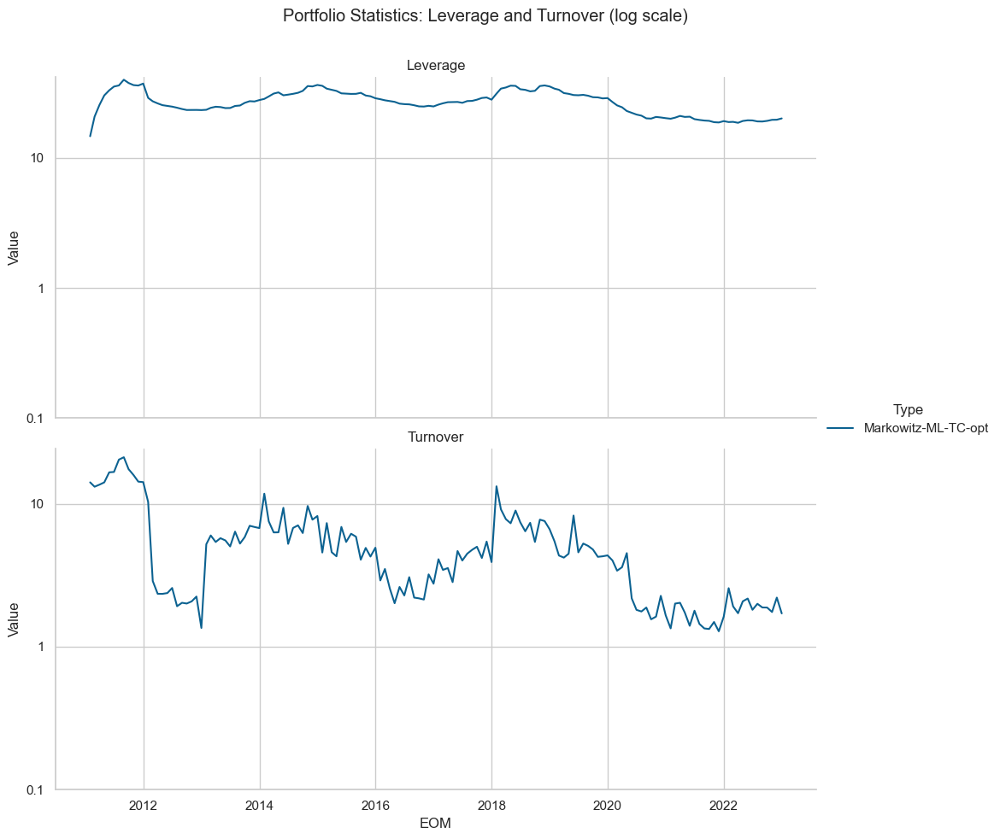

In [23]:
# 1. Kopier data for Markowitz-ML
tpf_pf = tpf_trans['pf'].copy()

# 2. Sæt type-kolonnen til "Markowitz-ML"
tpf_pf["type"] = "Markowitz-ML-TC-opt"

# 3. Vælg de relevante kolonner: eom_ret, inv og turnover (samt type)
ws = tpf_pf[['eom_ret', 'inv', 'turnover', 'type']].copy()

# 4. Omdøb eom_ret til eom for korthed
ws.rename(columns={'eom_ret': 'eom'}, inplace=True)

# 5. Konverter til long format, så vi kan plotte Leverage og Turnover i separate paneler
ws_long = ws.melt(
    id_vars=['type', 'eom'],
    value_vars=['inv', 'turnover'],
    var_name='metric',
    value_name='value'
)

# 6. Omdøb metric-værdier til pænere navne
ws_long['metric'] = ws_long['metric'].map({
    'inv': 'Leverage',
    'turnover': 'Turnover'
})

# 7. Plot med Seaborn's FacetGrid
g = sns.FacetGrid(ws_long, col="metric", col_wrap=1, sharey=False, height=5, aspect=2)
g.map_dataframe(sns.lineplot, x="eom", y="value", hue="type", style="type")

# Sæt y-aksen til log-skala
g.set(yscale="log")

# Fjern "metric = " i facettitlen
g.set_titles("{col_name}")

# Tilføj en fælles legend
g.add_legend(title="Type")

# Angiv egne ticks på y-aksen
for ax in g.axes.flatten():
    ax.set_yticks([0.1, 1, 10])
    ax.set_yticklabels(['0.1', '1', '10'])

# Sæt akse-labels og en overordnet titel
g.set_axis_labels("EOM", "Value")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Portfolio Statistics: Leverage and Turnover (log scale)")

plt.show()


In [24]:
# Antal unikke id’er
antal_unikke = tpf_trans['w']['id'].nunique()
print(f"Der er {antal_unikke} unikke id'er i dataframe’en.")


Der er 771 unikke id'er i dataframe’en.


In [25]:
#Interssant id'er
#10107 (JA) (MSFT,MICROSOFT CORP)
#11308 (JA) (KO,COCA COLA CO)
#11674 (JA) (DTE,D T E ENERGY CO)
#12781 (JA) (SR,SPIRE INC)
#23229 (JA) (CMS,C M S ENERGY CORP)

In [26]:
alle_ids = tpf_trans['w']['id'].tolist()
#print(alle_ids)


Find nogle interssant id'er

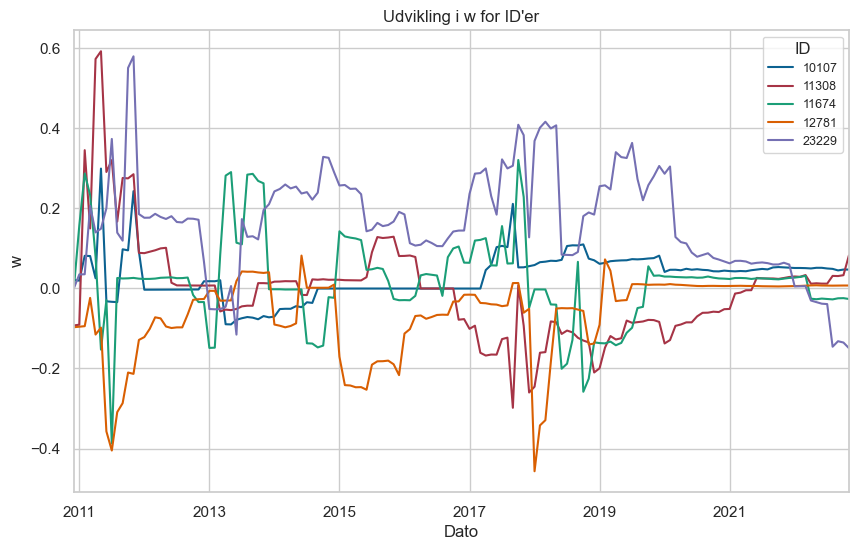

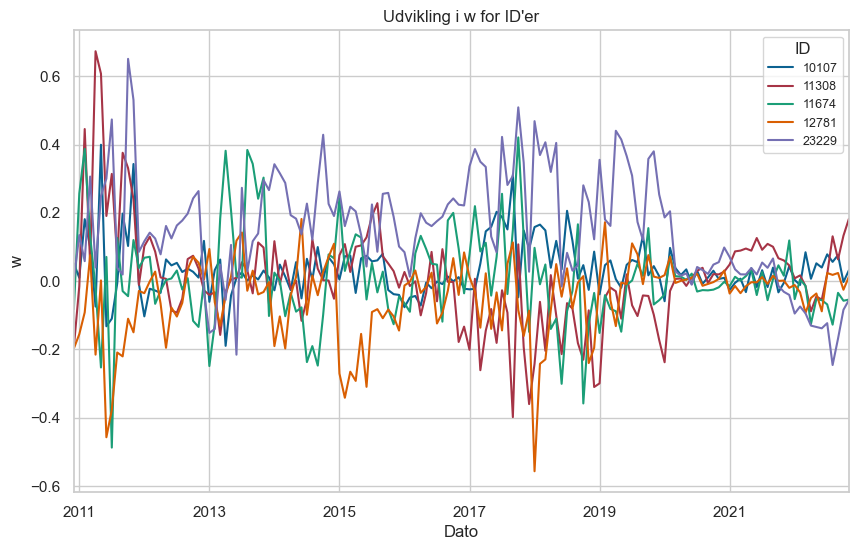

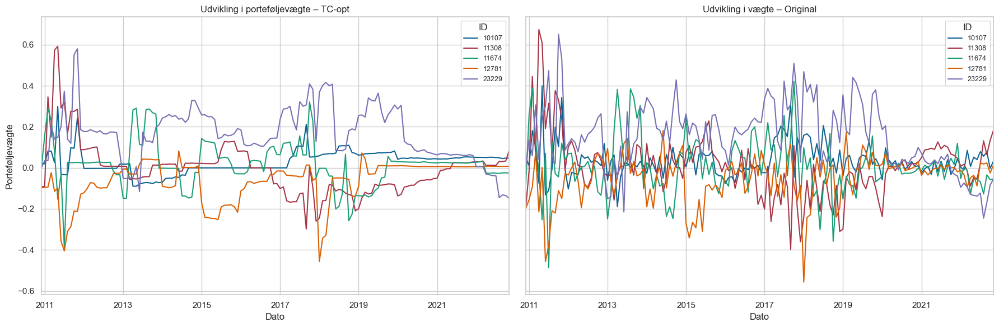

In [27]:
my_ids = [10107, 11308, 11674, 12781, 23229]
plot_specific_ids(tpf_trans["w"], my_ids, weight_col='w') 
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w')  

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot TC-optimeret
plot_specific_ids(tpf_trans["w"], my_ids, weight_col='w', ax=axes[0], show_legend=True)
axes[0].set_title("Udvikling i porteføljevægte – TC-opt")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("Porteføljevægte")

# Plot original
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w', ax=axes[1], show_legend=True)
axes[1].set_title("Udvikling i vægte – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt_udvalgte_delta_01.png"), dpi=300, bbox_inches='tight')
plt.show()


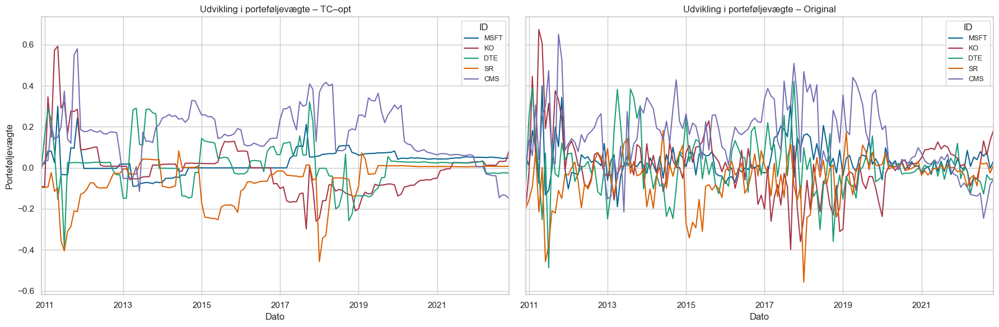

In [29]:
import matplotlib.pyplot as plt
import os

# 1) Lav din id→ticker mapping
id_to_ticker = {
    10107: 'MSFT',
    11308: 'KO',
    11674: 'DTE',
    12781: 'SR',
    23229: 'CMS'
}

my_ids = [10107, 11308, 11674, 12781, 23229]

# 2) Opsæt dine plots som før
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# TC‑opt
plot_specific_ids(tpf_trans["w"], my_ids, weight_col='w', ax=axes[0], show_legend=True)
axes[0].set_title("Udvikling i porteføljevægte – TC–opt")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("Porteføljevægte")

# Original
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w', ax=axes[1], show_legend=True)
axes[1].set_title("Udvikling i porteføljevægte – Original")
axes[1].set_xlabel("Dato")

# 3) Erstat legend‑labels med tickere
for ax in axes:
    leg = ax.get_legend()
    for text in leg.texts:
        orig_id = int(text.get_text())     # “10107” → 10107
        text.set_text(id_to_ticker[orig_id])

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt_udvalgte_delta01.png"),
            dpi=300, bbox_inches='tight')
plt.show()


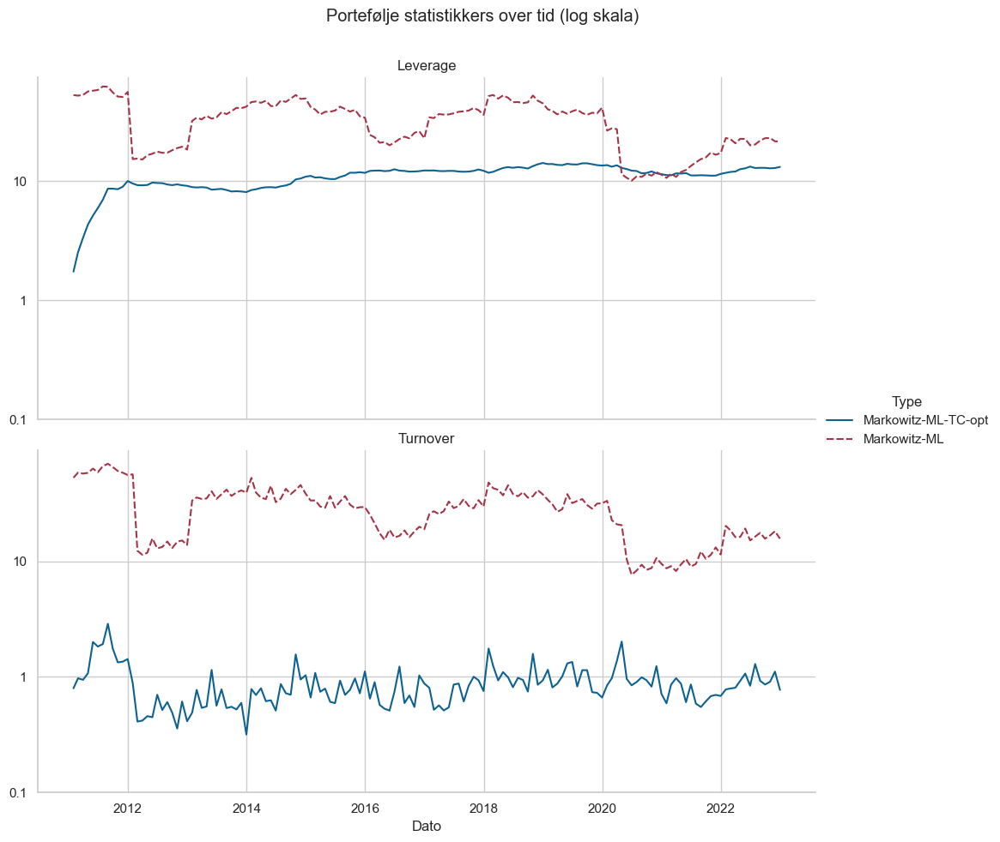

In [89]:


# 1) Kopiér og mærk trans‑datasættet
pf_trans = tpf_trans['pf'].copy()
pf_trans['type'] = "Markowitz-ML-TC-opt"

# 2) Kopiér og mærk original‑datasættet
pf_orig  = tpf_original['pf'].copy()
pf_orig['type']  = "Markowitz-ML"

# 3) Saml dem i ét DataFrame
ws = pd.concat([pf_trans, pf_orig], ignore_index=True)

# 4) Udvælg og omdøb
ws = ws[['eom_ret', 'inv', 'turnover', 'type']].rename(columns={'eom_ret':'eom'})
# 5) Smelt til long
ws_long = ws.melt(
    id_vars=['type','eom'],
    value_vars=['inv','turnover'],
    var_name='metric',
    value_name='value'
)
# 6) Pæne navne
ws_long['metric'] = ws_long['metric'].map({
    'inv': 'Leverage',
    'turnover': 'Turnover'
})

# 7) Plot med FacetGrid
g = sns.FacetGrid(ws_long, col="metric", col_wrap=1,
                  sharey=False, height=5, aspect=2)
g.map_dataframe(sns.lineplot, x="eom", y="value",
                hue="type", style="type")

# Log-scale, titler og ticks
g.set(yscale="log")
g.set_titles("{col_name}")
g.add_legend(title="Type")
for ax in g.axes.flatten():
    ax.set_yticks([0.1,1,10])
    ax.set_yticklabels(['0.1','1','10'])

g.set_axis_labels("Dato","")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Portefølje statistikkers over tid (log skala)")

plt.show()


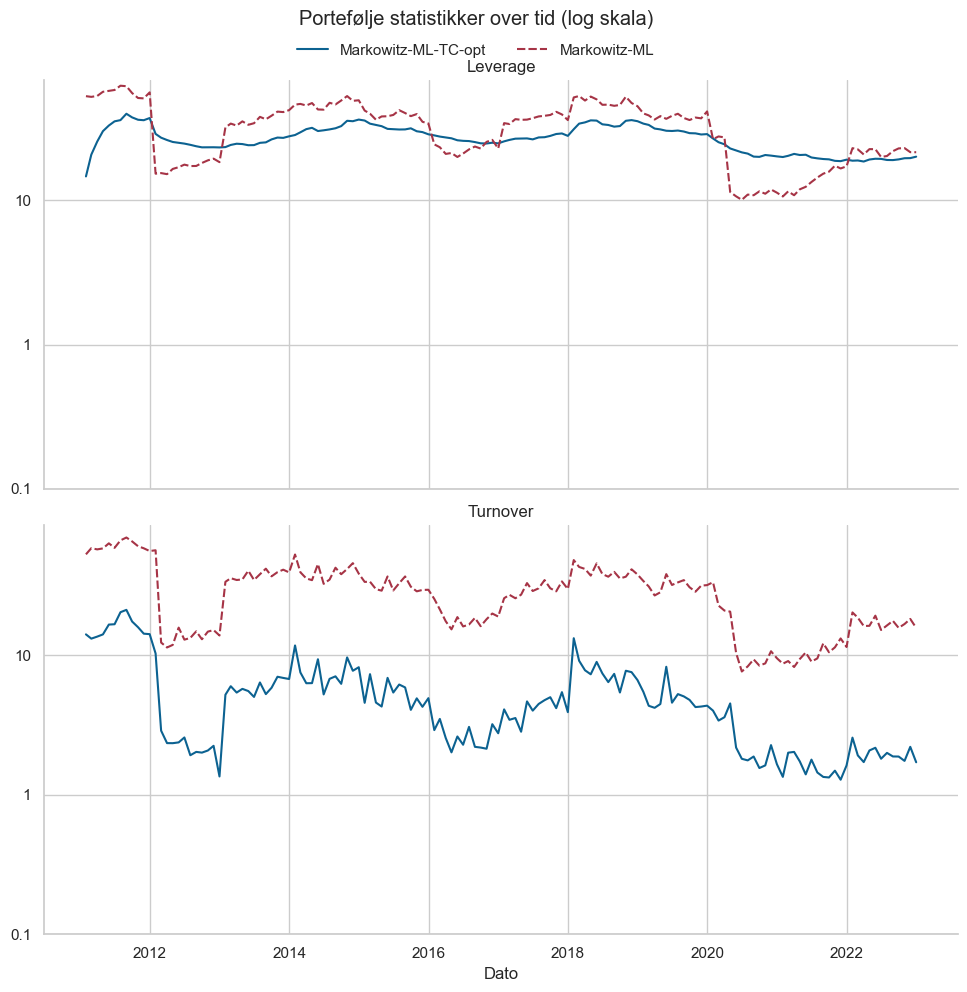

In [127]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Data prep ---
# 1) Kopiér og mærk trans‑datasættet
pf_trans = tpf_trans['pf'].copy()
pf_trans['type'] = "Markowitz-ML-TC-opt"

# 2) Kopiér og mærk original‑datasættet
pf_orig = tpf_original['pf'].copy()
pf_orig['type'] = "Markowitz-ML"

# 3) Saml dem i ét DataFrame
ws = pd.concat([pf_trans, pf_orig], ignore_index=True)

# 4) Udvælg og omdøb kolonner
ws = ws[['eom_ret', 'inv', 'turnover', 'type']].rename(columns={'eom_ret': 'eom'})

# 5) Smelt til long format
ws_long = ws.melt(
    id_vars=['type', 'eom'],
    value_vars=['inv', 'turnover'],
    var_name='metric',
    value_name='value'
)

# 6) Giv pænere navne til metrics
ws_long['metric'] = ws_long['metric'].map({
    'inv': 'Leverage',
    'turnover': 'Turnover'
})

# --- Plot med FacetGrid ---
g = sns.FacetGrid(ws_long, col="metric", col_wrap=1,
                  sharey=False, height=5, aspect=2)
g.map_dataframe(sns.lineplot, x="eom", y="value",
                hue="type", style="type")

# Log-scale, titler og yticks
g.set(yscale="log")
g.set_titles("{col_name}")
g.set_axis_labels("Dato", "")
for ax in g.axes.flatten():
    ax.set_yticks([0.1, 1, 10])
    ax.set_yticklabels(['0.1', '1', '10'])

# --- Justér suptitle og legend-placering ---
# 1) Træk plottets top lidt op, så titel og legend får plads
g.fig.subplots_adjust(top=0.92)

# 2) Sæt suptitel helt i toppen
g.fig.suptitle("Portefølje statistikker over tid (log skala)", y=0.99)

# 3) Fjern FacetGrid’s indbyggede legend (hvis den findes)
if g._legend:
    g._legend.remove()

# 4) Hent handles og labels fra én af aksene
handles, labels = g.axes[0].get_legend_handles_labels()

# 5) Placér én samlet legend-centret øverst lige under titlen
g.fig.legend(
    handles=handles,
    labels=labels,
    title="",
    loc='upper center',
    bbox_to_anchor=(0.5, 0.97),
    ncol=len(labels),
    frameon=False
)
plt.savefig(os.path.join(output_folder, "port_stats_tc_optimering_delta_01.png"), dpi=300, bbox_inches='tight')
plt.show()


# Tuning af parameteren delta - med gemte resultater

In [128]:
import numpy as np
import pandas as pd

# Antag at tpf_original allerede er defineret, og at chars, barra_cov, wealth, dates_oos, pf_set er på plads

# Definér det interval af delta’er, du vil køre over
deltas = np.arange(0.01, 0.41, 0.01)

# Liste til at indsamle resultaterne
results = []

for delta in deltas:
    print("delta:", delta)
    # Kør din pipeline med den aktuelle delta
    tpf_trans = run_markowitz_qp_pipeline(
        data=chars,
        cov_list=barra_cov,
        wealth=wealth,
        dates=dates_oos,
        gam=pf_set["gamma_rel"],
        delta=delta,
        alpha=0
    )
    # Beregn nøgletal for denne portefølje
    metrics = calculate_portfolio_metrics(tpf_trans)
    # Tilføj delta‑værdien for senere at kunne indeksere
    metrics["delta"] = delta
    results.append(metrics)

# Byg en DataFrame og sat delta som indeks
df_deltas = pd.DataFrame(results).set_index("delta")

# Vis DataFrame’en
display(df_deltas)

# Eksporter til LaTeX
latex_table = df_deltas.to_latex(
    float_format="%.4f",
    caption="Porteføljemålepunkter som funktion af δ",
    label="tab:portfolio_metrics_by_delta"
)
print(latex_table)


delta: 0.01
delta: 0.02
delta: 0.03
delta: 0.04
delta: 0.05
delta: 0.060000000000000005
delta: 0.06999999999999999
delta: 0.08
delta: 0.09
delta: 0.09999999999999999
delta: 0.11
delta: 0.12
delta: 0.13
delta: 0.14
delta: 0.15000000000000002
delta: 0.16
delta: 0.17
delta: 0.18000000000000002
delta: 0.19
delta: 0.2
delta: 0.21000000000000002
delta: 0.22
delta: 0.23
delta: 0.24000000000000002
delta: 0.25
delta: 0.26
delta: 0.27
delta: 0.28
delta: 0.29000000000000004
delta: 0.3
delta: 0.31
delta: 0.32
delta: 0.33
delta: 0.34
delta: 0.35000000000000003
delta: 0.36000000000000004
delta: 0.37
delta: 0.38
delta: 0.39
delta: 0.4


,r_yearly,std_yearly,SR_gross_yearly,tc_yearly,r_tc_yearly,SR_net_yearly,inv,Shorting,Turnover
delta,,,,,,,,,
0.01,0.375841,0.451811,0.831856,53.237125,-52.861284,-116.998735,31.100535,15.016687,22.174188
0.02,0.361557,0.445214,0.812097,41.067353,-40.705795,-91.429706,29.959822,14.505667,17.606464
0.03,0.328998,0.429483,0.766034,32.496047,-32.167049,-74.897217,29.212220,14.213920,14.364221
0.04,0.329028,0.427535,0.769594,26.235838,-25.906809,-60.595764,28.723468,14.030352,11.973715
0.05,0.325579,0.421662,0.772133,21.558589,-21.233010,-50.355543,28.421100,13.928119,10.160849
0.06,0.341968,0.415108,0.823805,17.935530,-17.593562,-42.383134,28.206502,13.809183,8.749784
0.07,0.362961,0.405783,0.894469,15.025161,-14.662200,-36.133065,27.974750,13.656372,7.615759
0.08,0.374703,0.402870,0.930084,12.647735,-12.273032,-30.464020,27.630739,13.466627,6.682153
0.09,0.375505,0.396454,0.947159,10.709589,-10.334083,-26.066266,27.387990,13.372954,5.916672


\begin{table}
\caption{Porteføljemålepunkter som funktion af δ}
\label{tab:portfolio_metrics_by_delta}
\begin{tabular}{lrrrrrrrrr}
\toprule
 & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
delta &  &  &  &  &  &  &  &  &  \\
\midrule
0.010000 & 0.3758 & 0.4518 & 0.8319 & 53.2371 & -52.8613 & -116.9987 & 31.1005 & 15.0167 & 22.1742 \\
0.020000 & 0.3616 & 0.4452 & 0.8121 & 41.0674 & -40.7058 & -91.4297 & 29.9598 & 14.5057 & 17.6065 \\
0.030000 & 0.3290 & 0.4295 & 0.7660 & 32.4960 & -32.1670 & -74.8972 & 29.2122 & 14.2139 & 14.3642 \\
0.040000 & 0.3290 & 0.4275 & 0.7696 & 26.2358 & -25.9068 & -60.5958 & 28.7235 & 14.0304 & 11.9737 \\
0.050000 & 0.3256 & 0.4217 & 0.7721 & 21.5586 & -21.2330 & -50.3555 & 28.4211 & 13.9281 & 10.1608 \\
0.060000 & 0.3420 & 0.4151 & 0.8238 & 17.9355 & -17.5936 & -42.3831 & 28.2065 & 13.8092 & 8.7498 \\
0.070000 & 0.3630 & 0.4058 & 0.8945 & 15.0252 & -14.6622 & -36.1331 & 27.9747 & 13.6564 & 7.6

# Markowitz-ML med transactions cost optimering (lukket løsning)

In [31]:
import numpy as np
import pandas as pd
from scipy.optimize import brentq
import cvxpy as cp  # Hvis du ellers bruger cvxpy et andet sted
import General_Functions  # Skal indeholde fx: initial_weights_new, create_cov, pf_ts_fun osv.

def solve_closed_form_portfolio(w_start, pi_opt, lambda_vec, delta, tol=1e-8):
    """
    Løser den lukkede optimering:
    
        min_{pi} (pi - w_start)^T Λ (pi - w_start)
        s.t. ||pi - pi_opt||_2^2 = delta^2
    
    Med den ekspl. komponentvise løsning:
    
        pi_i = (lambda_i/(lambda_i + eta)) * w_start_i + (eta/(lambda_i+eta)) * pi_opt_i,
    
    hvor eta findes ved at løse:
    
        sum_i [ (lambda_i/(lambda_i+eta) * (w_start_i - pi_opt_i))^2 ] = delta^2.
    
    Parametre:
        w_start   : Numpy-array med den afkastjusterede portefølje (w_start)
        pi_opt    : Numpy-array med de optimale vægte (pi_opt)
        lambda_vec: Numpy-array med transaktionsomkostningsparametre (diagonale elementer af Λ)
        delta     : Radius δ for den kvadratiske afstand.
        tol       : Tolerance for rodfinding.
        
    Returnerer:
        pi_new    : Numpy-array med de nye porteføljevægte.
        eta       : Den fundne værdi for Lagrange-multiplikatoren.
    """
    def f(eta):
        factors = lambda_vec / (lambda_vec + eta)
        diff = factors * (w_start - pi_opt)
        return np.sum(diff**2) - delta**2

    # Vi forventer, at f(0) > 0, dvs. den ubetingede løsning ligger udenfor delta-kuglen.
    f0 = f(0)
    if f0 < 0:
        return w_start, 0.0

    eta_solution = brentq(f, a=1e-8, b=1e8, xtol=tol)
    factors = lambda_vec / (lambda_vec + eta_solution)
    pi_new = factors * w_start + (eta_solution / (lambda_vec + eta_solution)) * pi_opt

    return pi_new, eta_solution


def tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta):
    """
    Udregner porteføljevægtene dato-for-dato ved at bruge den lukkede løsning.
    
    Her beregnes:
      - Et optimalt udgangspunkt pi_opt (fx udregnet med Markowitz-formlen), og
      - Den forrige periodes vægte w_start (afkastjusteret via adjust_w_prev_for_returns).
    
    Porteføljen opdateres via:
        pi_new = (lambda_vec/(lambda_vec + eta)) * w_start + (eta/(lambda_vec+eta)) * pi_opt,
    hvor eta findes numerisk så:
        || (lambda_vec/(lambda_vec+eta)) * (w_start - pi_opt) ||^2 = delta^2.
    
    Parametre:
      data    : DataFrame med aktiedata (skal indeholde 'id', 'eom', 'tr_ld1', 'pred_ld1' og evt. 'lambda')
      cov_list: Dictionary med kovariansmatricer (nøgle: dato)
      wealth  : DataFrame med wealth-data (fx 'eom' og 'mu_ld1')
      dates   : Liste af datoer
      gam     : Risikoparameter
      delta   : Afstandskonstant for constrainten: ||pi - pi_opt||^2 = delta^2.
      
    Returnerer:
      tpf_opt : DataFrame med kolonnerne ['id', 'eom', 'w'] for hver dato.
    """
    # Filter og sorter data
    data_rel = data[(data['valid'] == True) & (data['eom'].isin(dates))][['id','eom','me','tr_ld1','pred_ld1']]
    data_rel = data_rel.sort_values(by=['id','eom'])
    data_split = {d: df for d, df in data_rel.groupby('eom')}
    
    # Helper-funktion til afkastjustering af w_prev
    def adjust_w_prev_for_returns(w_prev_series, df_current, wealth_current):
        df_current = df_current.set_index('id')
        w_prev_aligned = w_prev_series.reindex(df_current.index).fillna(0)
        tr_ld1 = df_current['tr_ld1']
        mu_ld1 = wealth_current['mu_ld1'].iloc[0]  # antager én værdi pr. dato
        return w_prev_aligned * (1 + tr_ld1) / (1 + mu_ld1)
    
    tpf_opt_list = []
    
    # For den første dato: brug initiale VW-vægte
    first_date = dates[0]
    data_first = data_split[first_date]
    init_w = General_Functions.initial_weights_new(data_first, w_type="vw")
    w_prev_series = pd.Series(init_w['w_start'].values, index=init_w['id'])
    
    for d in dates:
        data_sub = data_split.get(d)
        if data_sub is None or data_sub.empty:
            continue

        # Udregn pi_opt med fx Markowitz-metoden:
        ids = data_sub['id'].tolist()
        d_key = d.strftime('%Y-%m-%d') if isinstance(d, pd.Timestamp) else d
        sigma = General_Functions.create_cov(cov_list[d_key], ids=ids)
        pred_vector = data_sub['pred_ld1'].values
        pi_opt = (1 / gam) * np.linalg.solve(sigma, pred_vector)
        
        # Brug lambda-vektoren fra data_sub (hvis tilgængelig) eller sæt til 1 for alle aktiver:
        lambda_vec = data_sub['lambda'].values if 'lambda' in data_sub.columns else np.ones_like(pi_opt)
        
        # Justér w_prev_series for afkast til at få w_start
        wealth_d = wealth.loc[wealth['eom'] == d]
        w_start = adjust_w_prev_for_returns(w_prev_series, data_sub, wealth_d).values
        
        # Kaldes den lukkede løsning (bruger w_start direkte i stedet for g*pi_prev):
        try:
            pi_new, eta = solve_closed_form_portfolio(w_start, pi_opt, lambda_vec, delta)
        except ValueError as e:
            print(f"Fejl ved dato {d}: {e}")
            continue
        
        # Gem resultat for denne dato:
        temp_df = data_sub[['id', 'eom']].copy()
        temp_df['w'] = pi_new
        tpf_opt_list.append(temp_df)
        
        # Opdater w_prev_series til næste iteration:
        w_prev_series = pd.Series(pi_new, index=data_sub['id'])
    
    if tpf_opt_list:
        tpf_opt = pd.concat(tpf_opt_list, ignore_index=True)
    else:
        tpf_opt = pd.DataFrame(columns=['id','eom','w'])
    
    return tpf_opt

def run_markowitz_closed_form_pipeline(data, cov_list, wealth, dates, gam, delta):
    # 1) Beregn porteføljevægte dato-for-dato med den lukkede løsning
    tpf_opt = tpf_implement_closed_form(data, cov_list, wealth, dates, gam, delta)
    
    # 2) Efterbehandling via w-funktionen (hvis nødvendigt)
    tpf_w = w_fun_qpstyle(tpf_opt, data, wealth, dates)
    
    # 3) Beregn porteføljestatistikker
    tpf_pf = General_Functions.pf_ts_fun(tpf_w, data, wealth, gam)
    
    return {
        "w": tpf_w,
        "pf": tpf_pf
    }

# Eksempel på pipeline-kald:
tpf_trans_closed = run_markowitz_closed_form_pipeline(
    data=chars,
    cov_list=barra_cov,
    wealth=wealth,
    dates=dates_oos,
    gam=pf_set["gamma_rel"],
    delta=2  # Sæt delta efter behov
)

print("Optimerede vægte med lukket løsning:")
print(tpf_trans_closed["w"].head())
print("\nPorteføljestatistikker:")
print(tpf_trans_closed["pf"].head())


Optimerede vægte med lukket løsning:
      id        eom   w_start         w  tr_ld1  mu_ld1
0  10032 2010-12-31  0.000115 -0.000152     NaN     NaN
1  10104 2010-12-31  0.014485 -0.011782     NaN     NaN
2  10107 2010-12-31  0.021481  0.029860     NaN     NaN
3  10138 2010-12-31  0.001530 -0.036002     NaN     NaN
4  10145 2010-12-31  0.003799  0.048538     NaN     NaN

Porteføljestatistikker:
         inv   shorting   turnover         r        tc    eom_ret
0  15.308009   7.260509  15.187492  0.083615  1.165644 2011-01-31
1  19.781149   9.508417  11.985754  0.166631  0.570490 2011-02-28
2  23.692909  11.527228  12.071440  0.139676  0.689003 2011-03-31
3  27.535039  13.446458  11.064400  0.171962  0.528261 2011-04-30
4  30.999675  15.166743  16.005337  0.034139  1.385853 2011-05-31


In [32]:
df_metrics = compare_portfolio_metrics(tpf_original, tpf_trans_closed)
display(df_metrics)
latex_table = df_metrics.to_latex(index=False, float_format="%.4f", caption="Sammenligning af porteføljemålepunkter", label="tab:portfolio_metrics")
print(latex_table)
latex_table = df_metrics.set_index("Metric").T.to_latex(
    float_format="%.4f",
    caption="Sammenligning af porteføljemålepunkter (transponeret)",
    label="tab:portfolio_metrics_transposed"
)
print(latex_table)

,Metric,Markowitz-ML,Markowitz-ML TC optimeret
0,r_yearly,0.447758,0.563738
1,std_yearly,0.455910,0.489114
2,SR_gross_yearly,0.982119,1.152570
3,tc_yearly,71.293004,1.651435
4,r_tc_yearly,-70.845246,-1.087697
5,SR_net_yearly,-155.392964,-2.223811
6,inv,32.825146,27.858364
7,Shorting,15.844005,12.997653
8,Turnover,29.008202,3.473580


\begin{table}
\caption{Sammenligning af porteføljemålepunkter}
\label{tab:portfolio_metrics}
\begin{tabular}{lrr}
\toprule
Metric & Markowitz-ML & Markowitz-ML TC optimeret \\
\midrule
r_yearly & 0.4478 & 0.5637 \\
std_yearly & 0.4559 & 0.4891 \\
SR_gross_yearly & 0.9821 & 1.1526 \\
tc_yearly & 71.2930 & 1.6514 \\
r_tc_yearly & -70.8452 & -1.0877 \\
SR_net_yearly & -155.3930 & -2.2238 \\
inv & 32.8251 & 27.8584 \\
Shorting & 15.8440 & 12.9977 \\
Turnover & 29.0082 & 3.4736 \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}
\caption{Sammenligning af porteføljemålepunkter (transponeret)}
\label{tab:portfolio_metrics_transposed}
\begin{tabular}{lrrrrrrrrr}
\toprule
Metric & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
\midrule
Markowitz-ML & 0.4478 & 0.4559 & 0.9821 & 71.2930 & -70.8452 & -155.3930 & 32.8251 & 15.8440 & 29.0082 \\
Markowitz-ML TC optimeret & 0.5637 & 0.4891 & 1.1526 & 1.6514 & -1.0877 & -2.2238 & 27.

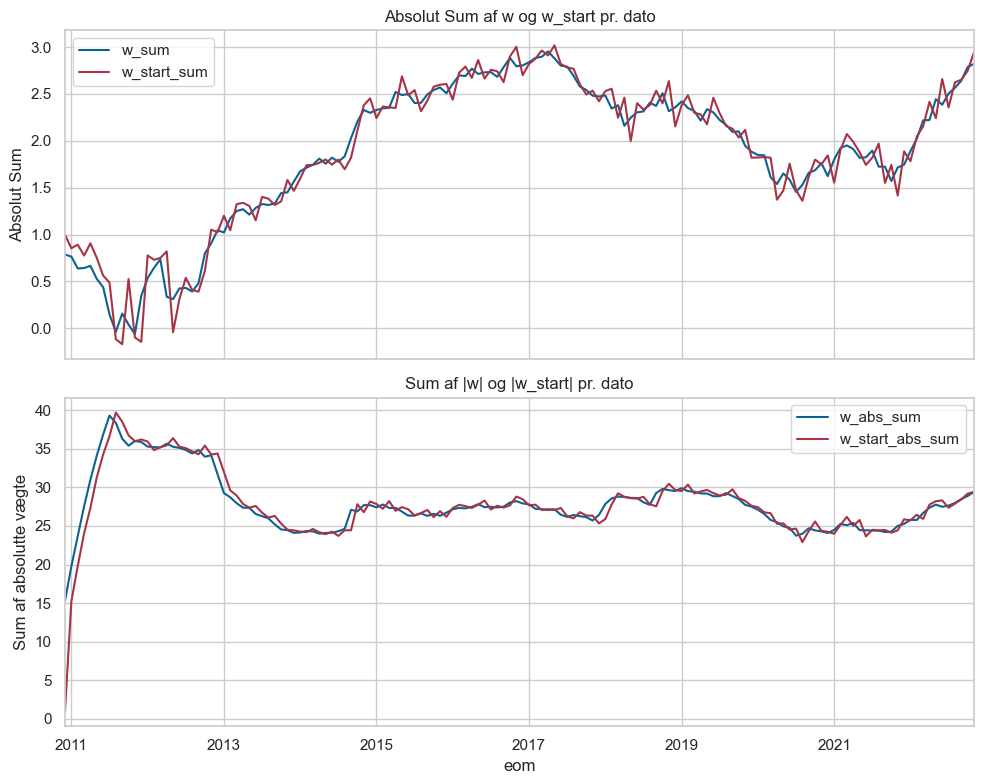

In [33]:
df = tpf_trans_closed["w"].copy()

# 1) Gruppér pr. dato (eom) og beregn sum af w, sum af w_start,
#    samt sum af |w| og sum af |w_start|
df_agg = df.groupby("eom").agg({
    "w": ["sum", lambda x: x.abs().sum()],
    "w_start": ["sum", lambda x: x.abs().sum()]
})

# 2) Giv kolonnerne mere sigende navne
df_agg.columns = ["w_sum", "w_abs_sum", "w_start_sum", "w_start_abs_sum"]

# 3) Plot
fig, ax = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot sum(w) og sum(w_start) i øverste subplot
df_agg[["w_sum", "w_start_sum"]].plot(ax=ax[0])
ax[0].set_title("Absolut Sum af w og w_start pr. dato")
ax[0].set_ylabel("Absolut Sum")

# Plot sum(|w|) og sum(|w_start|) i nederste subplot
df_agg[["w_abs_sum", "w_start_abs_sum"]].plot(ax=ax[1])
ax[1].set_title("Sum af |w| og |w_start| pr. dato")
ax[1].set_ylabel("Sum af absolutte vægte")

plt.tight_layout()
plt.show()


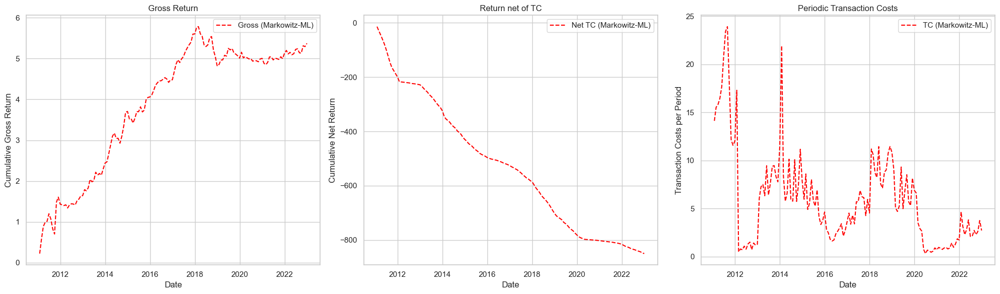

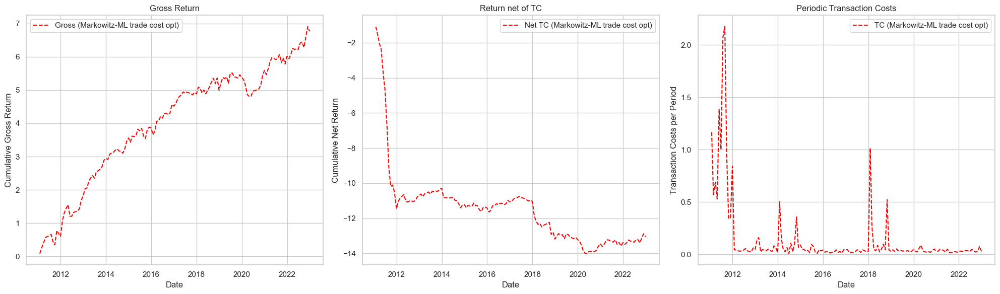

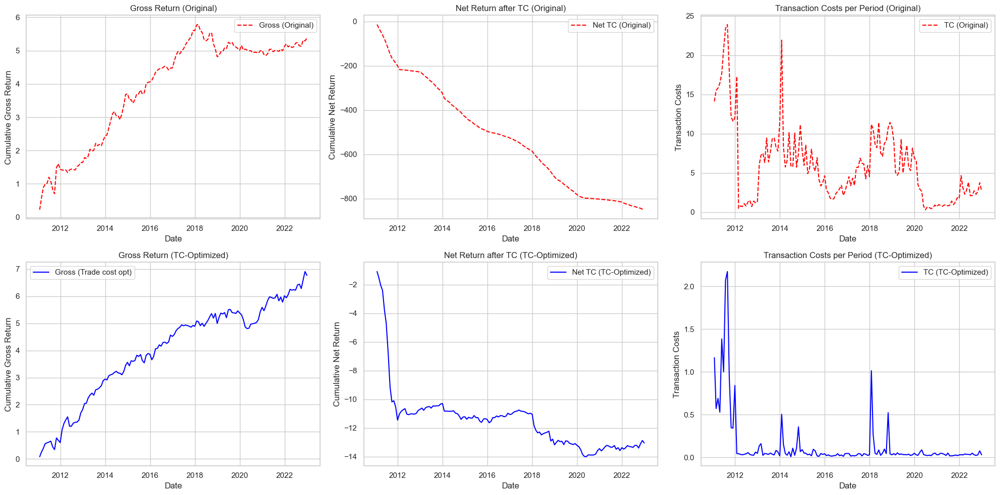

In [34]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_closed["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_original.png"), dpi=300, bbox_inches='tight')
plt.show()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt.png"), dpi=300, bbox_inches='tight')
plt.show()

# Beregn kumulative afkast for begge
tpf_data = tpf_original["pf"].copy()
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_closed["pf"].copy()
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret samlet plot med 2 rækker (original og trade-cost-opt) og 3 kolonner
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# --- Øverste række: Original Markowitz-ML ---
axes[0, 0].plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Original)', color='red', linestyle='--')
axes[0, 0].set_title('Gross Return (Original)')
axes[0, 0].set_xlabel('Date')
axes[0, 0].set_ylabel('Cumulative Gross Return')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Original)', color='red', linestyle='--')
axes[0, 1].set_title('Net Return after TC (Original)')
axes[0, 1].set_xlabel('Date')
axes[0, 1].set_ylabel('Cumulative Net Return')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Original)', color='red', linestyle='--')
axes[0, 2].set_title('Transaction Costs per Period (Original)')
axes[0, 2].set_xlabel('Date')
axes[0, 2].set_ylabel('Transaction Costs')
axes[0, 2].legend()
axes[0, 2].grid(True)

# --- Nederste række: Trade Cost Optimeret ---
axes[1, 0].plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Trade cost opt)', color='blue', linestyle='-')
axes[1, 0].set_title('Gross Return (TC-Optimized)')
axes[1, 0].set_xlabel('Date')
axes[1, 0].set_ylabel('Cumulative Gross Return')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 1].set_title('Net Return after TC (TC-Optimized)')
axes[1, 1].set_xlabel('Date')
axes[1, 1].set_ylabel('Cumulative Net Return')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[1, 2].plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 2].set_title('Transaction Costs per Period (TC-Optimized)')
axes[1, 2].set_xlabel('Date')
axes[1, 2].set_ylabel('Transaction Costs')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Fælles layout og gem
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt_combined.png"), dpi=300, bbox_inches='tight')

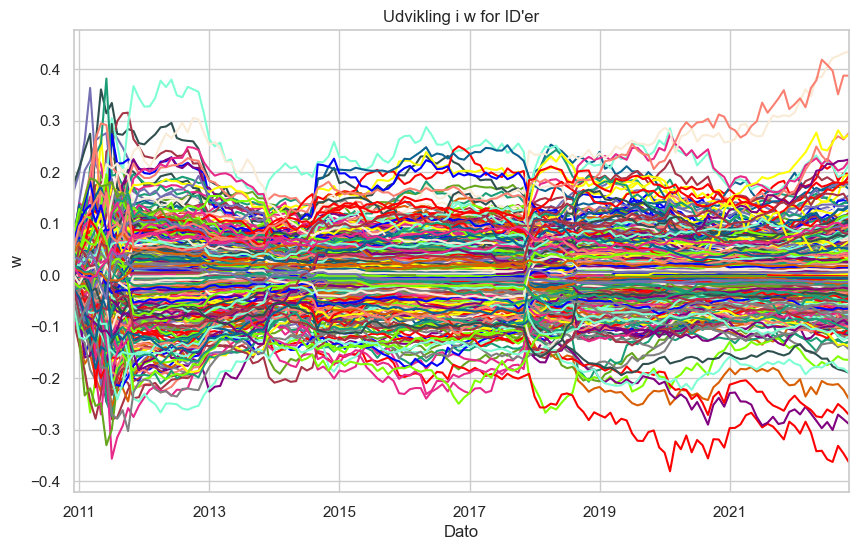

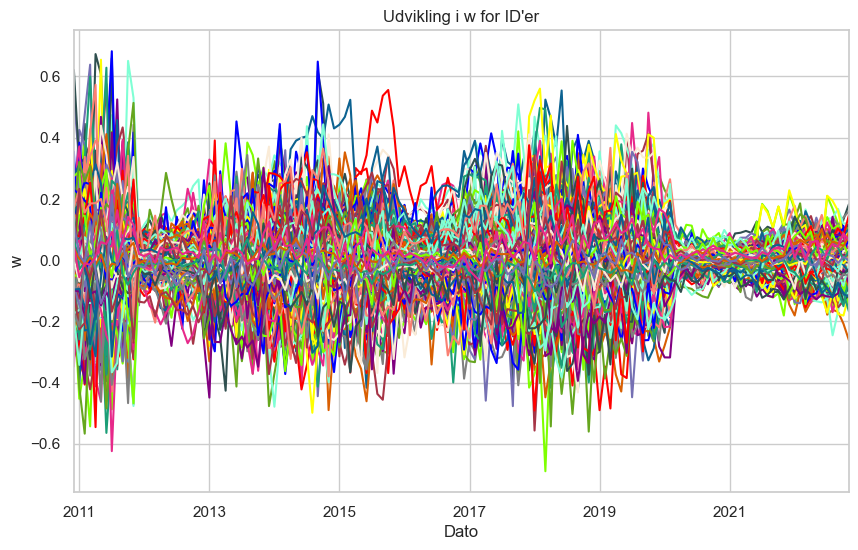

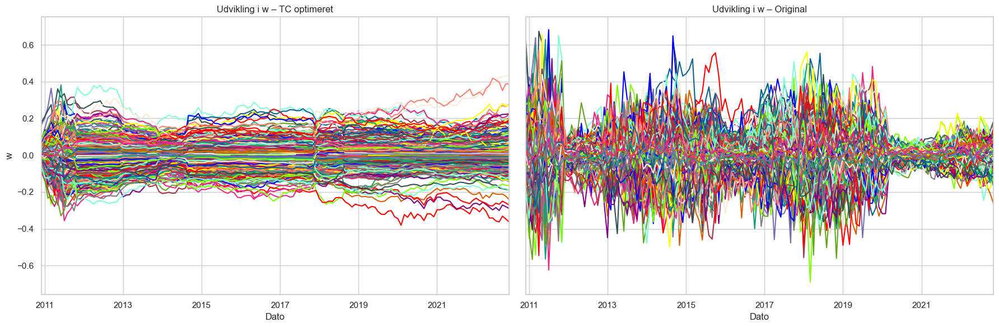

In [35]:
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_original["w"], id_list=None, weight_col='w', show_legend=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot tpf_original
plot_specific_ids(tpf_original["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_MVO_ML_TC_optimeret"), dpi=300, bbox_inches='tight')
plt.show()


# Tuning af parameteren delta - med gemte resultater (lukket løsning)

In [138]:
import numpy as np
import pandas as pd

# Antag at chars, barra_cov, wealth, dates_oos, pf_set er defineret

# Definér intervallet af delta’er
deltas = np.arange(0.01, 4.01, 0.01)

# Liste til at samle resultaterne
results_closed = []

for delta in deltas:
    print(f"delta (closed-form): {delta:.2f}")
    # Kør den lukkede-form pipeline med den aktuelle delta
    tpf_trans_closed = run_markowitz_closed_form_pipeline(
        data=chars,
        cov_list=barra_cov,
        wealth=wealth,
        dates=dates_oos,
        gam=pf_set["gamma_rel"],
        delta=delta
    )
    # Beregn metrics
    metrics = calculate_portfolio_metrics(tpf_trans_closed)
    # Gem delta-værdien i resultatet
    metrics["delta"] = delta
    results_closed.append(metrics)

# Konverter til DataFrame og sæt delta som indeks
df_closed = pd.DataFrame(results_closed).set_index("delta")

# Vis DataFrame
display(df_closed)

# Eksporter til LaTeX
latex_closed = df_closed.to_latex(
    float_format="%.4f",
    caption="Porteføljemålepunkter (lukkede form) som funktion af δ",
    label="tab:closedform_metrics_by_delta"
)
print(latex_closed)


delta (closed-form): 0.01
delta (closed-form): 0.02
delta (closed-form): 0.03
delta (closed-form): 0.04
delta (closed-form): 0.05
delta (closed-form): 0.06
delta (closed-form): 0.07
delta (closed-form): 0.08
delta (closed-form): 0.09
delta (closed-form): 0.10
delta (closed-form): 0.11
delta (closed-form): 0.12
delta (closed-form): 0.13
delta (closed-form): 0.14
delta (closed-form): 0.15
delta (closed-form): 0.16
delta (closed-form): 0.17
delta (closed-form): 0.18
delta (closed-form): 0.19
delta (closed-form): 0.20
delta (closed-form): 0.21
delta (closed-form): 0.22
delta (closed-form): 0.23
delta (closed-form): 0.24
delta (closed-form): 0.25
delta (closed-form): 0.26
delta (closed-form): 0.27
delta (closed-form): 0.28
delta (closed-form): 0.29
delta (closed-form): 0.30
delta (closed-form): 0.31
delta (closed-form): 0.32
delta (closed-form): 0.33
delta (closed-form): 0.34
delta (closed-form): 0.35
delta (closed-form): 0.36
delta (closed-form): 0.37
delta (closed-form): 0.38
delta (close

,r_yearly,std_yearly,SR_gross_yearly,tc_yearly,r_tc_yearly,SR_net_yearly,inv,Shorting,Turnover
delta,,,,,,,,,
0.01,0.447245,0.455260,0.982395,70.222280,-69.775035,-153.264193,32.745222,15.803973,28.752144
0.02,0.446701,0.454618,0.982585,69.165038,-68.718337,-151.156238,32.665525,15.764055,28.497108
0.03,0.446123,0.453985,0.982683,68.121178,-67.675055,-149.069023,32.586055,15.724251,28.243224
0.04,0.445510,0.453360,0.982684,67.090607,-66.645097,-147.002491,32.506785,15.684549,27.990297
0.05,0.444859,0.452745,0.982582,66.073229,-65.628369,-144.956595,32.427713,15.644946,27.738562
...,...,...,...,...,...,...,...,...,...
3.96,0.163095,0.148632,1.097310,0.000050,0.163045,1.096970,1.028628,0.000000,0.063576
3.97,0.163095,0.148632,1.097310,0.000050,0.163045,1.096970,1.028628,0.000000,0.063576
3.98,0.163095,0.148632,1.097310,0.000050,0.163045,1.096970,1.028628,0.000000,0.063576


\begin{table}
\caption{Porteføljemålepunkter (lukkede form) som funktion af δ}
\label{tab:closedform_metrics_by_delta}
\begin{tabular}{lrrrrrrrrr}
\toprule
 & r_yearly & std_yearly & SR_gross_yearly & tc_yearly & r_tc_yearly & SR_net_yearly & inv & Shorting & Turnover \\
delta &  &  &  &  &  &  &  &  &  \\
\midrule
0.010000 & 0.4472 & 0.4553 & 0.9824 & 70.2223 & -69.7750 & -153.2642 & 32.7452 & 15.8040 & 28.7521 \\
0.020000 & 0.4467 & 0.4546 & 0.9826 & 69.1650 & -68.7183 & -151.1562 & 32.6655 & 15.7641 & 28.4971 \\
0.030000 & 0.4461 & 0.4540 & 0.9827 & 68.1212 & -67.6751 & -149.0690 & 32.5861 & 15.7243 & 28.2432 \\
0.040000 & 0.4455 & 0.4534 & 0.9827 & 67.0906 & -66.6451 & -147.0025 & 32.5068 & 15.6845 & 27.9903 \\
0.050000 & 0.4449 & 0.4527 & 0.9826 & 66.0732 & -65.6284 & -144.9566 & 32.4277 & 15.6449 & 27.7386 \\
0.060000 & 0.4442 & 0.4521 & 0.9824 & 65.0689 & -64.6248 & -142.9313 & 32.3489 & 15.6054 & 27.4879 \\
0.070000 & 0.4434 & 0.4515 & 0.9821 & 64.0777 & -63.6342 & -140.9266 & 

## Relevante grafer og tabeller for den lukkede løsning

In [147]:
# Eksempel på pipeline-kald:
tpf_trans_closed = run_markowitz_closed_form_pipeline(
    data=chars,
    cov_list=barra_cov,
    wealth=wealth,
    dates=dates_oos,
    gam=pf_set["gamma_rel"],
    delta=2  # Sæt delta efter behov
)

print("Optimerede vægte med lukket løsning:")
print(tpf_trans_closed["w"].head())
print("\nPorteføljestatistikker:")
print(tpf_trans_closed["pf"].head())


Optimerede vægte med lukket løsning:
      id        eom   w_start         w  tr_ld1  mu_ld1
0  10032 2010-12-31  0.000115 -0.000152     NaN     NaN
1  10104 2010-12-31  0.014485 -0.011782     NaN     NaN
2  10107 2010-12-31  0.021481  0.029860     NaN     NaN
3  10138 2010-12-31  0.001530 -0.036002     NaN     NaN
4  10145 2010-12-31  0.003799  0.048538     NaN     NaN

Porteføljestatistikker:
         inv   shorting   turnover         r        tc    eom_ret
0  15.308009   7.260509  15.187492  0.083615  1.165644 2011-01-31
1  19.781149   9.508417  11.985754  0.166631  0.570490 2011-02-28
2  23.692909  11.527228  12.071440  0.139676  0.689003 2011-03-31
3  27.535039  13.446458  11.064400  0.171962  0.528261 2011-04-30
4  30.999675  15.166743  16.005337  0.034139  1.385853 2011-05-31


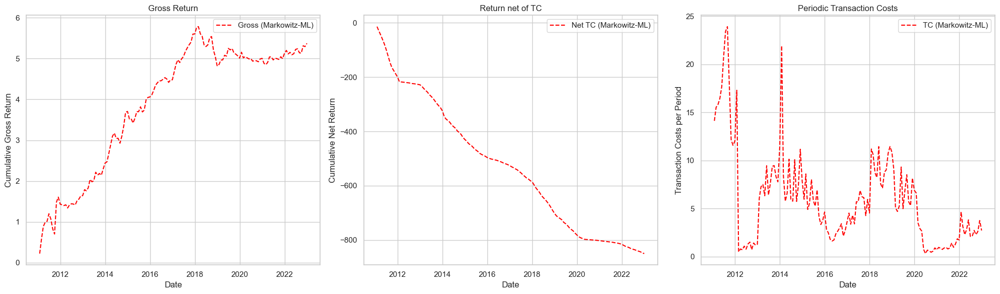

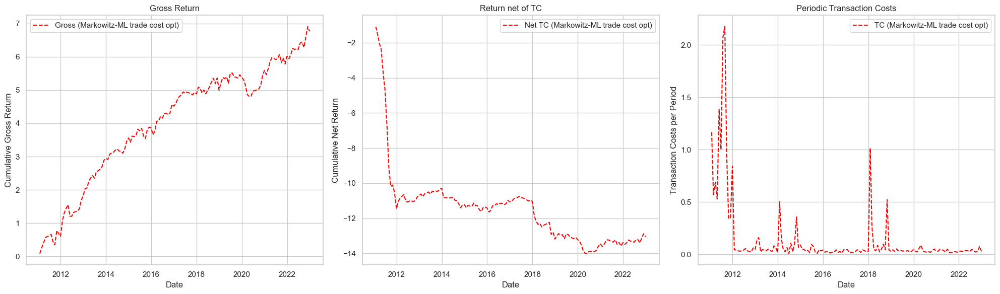

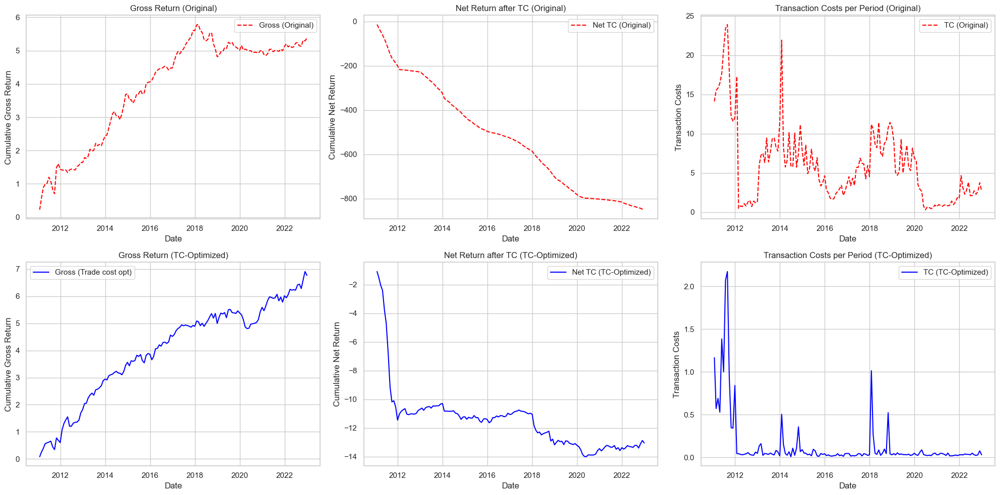

In [140]:
# Kopier dataframe for Markowitz-ML
tpf_data = tpf_original["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_closed["pf"].copy()

# Beregn kumulative afkast for Markowitz-ML
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Markowitz-ML)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_original.png"), dpi=300, bbox_inches='tight')
plt.show()

# Opret 3 subplots: Gross Return, Return net of TC og Periodiske Transaction Costs
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
# --- Plot 1: Gross Return ---
ax = axes[0]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Gross Return')
ax.set_title('Gross Return')
ax.grid(True)
ax.legend()

# --- Plot 2: Return net of TC ---
ax = axes[1]
ax.plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Cumulative Net Return')
ax.set_title('Return net of TC')
ax.grid(True)
ax.legend()

# --- Plot 3: Periodiske Transaction Costs ---
ax = axes[2]
ax.plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (Markowitz-ML trade cost opt)', color='red', linestyle='--')
ax.set_xlabel('Date')
ax.set_ylabel('Transaction Costs per Period')
ax.set_title('Periodic Transaction Costs')
ax.grid(True)
ax.legend()

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt.png"), dpi=300, bbox_inches='tight')
plt.show()

# Beregn kumulative afkast for begge
tpf_data = tpf_original["pf"].copy()
tpf_data['cumret'] = tpf_data['r'].cumsum()
tpf_data['cumret_tc'] = (tpf_data['r'] - tpf_data['tc']).cumsum()

tpf_data_new = tpf_trans_closed["pf"].copy()
tpf_data_new['cumret'] = tpf_data_new['r'].cumsum()
tpf_data_new['cumret_tc'] = (tpf_data_new['r'] - tpf_data_new['tc']).cumsum()

# Opret samlet plot med 2 rækker (original og trade-cost-opt) og 3 kolonner
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# --- Øverste række: Original Markowitz-ML ---
axes[0, 0].plot(tpf_data['eom_ret'], tpf_data['cumret'], label='Gross (Original)', color='red', linestyle='--')
axes[0, 0].set_title('Gross Return (Original)')
axes[0, 0].set_xlabel('Date')
axes[0, 0].set_ylabel('Cumulative Gross Return')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(tpf_data['eom_ret'], tpf_data['cumret_tc'], label='Net TC (Original)', color='red', linestyle='--')
axes[0, 1].set_title('Net Return after TC (Original)')
axes[0, 1].set_xlabel('Date')
axes[0, 1].set_ylabel('Cumulative Net Return')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[0, 2].plot(tpf_data['eom_ret'], tpf_data['tc'], label='TC (Original)', color='red', linestyle='--')
axes[0, 2].set_title('Transaction Costs per Period (Original)')
axes[0, 2].set_xlabel('Date')
axes[0, 2].set_ylabel('Transaction Costs')
axes[0, 2].legend()
axes[0, 2].grid(True)

# --- Nederste række: Trade Cost Optimeret ---
axes[1, 0].plot(tpf_data['eom_ret'], tpf_data_new['cumret'], label='Gross (Trade cost opt)', color='blue', linestyle='-')
axes[1, 0].set_title('Gross Return (TC-Optimized)')
axes[1, 0].set_xlabel('Date')
axes[1, 0].set_ylabel('Cumulative Gross Return')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(tpf_data['eom_ret'], tpf_data_new['cumret_tc'], label='Net TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 1].set_title('Net Return after TC (TC-Optimized)')
axes[1, 1].set_xlabel('Date')
axes[1, 1].set_ylabel('Cumulative Net Return')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[1, 2].plot(tpf_data['eom_ret'], tpf_data_new['tc'], label='TC (TC-Optimized)', color='blue', linestyle='-')
axes[1, 2].set_title('Transaction Costs per Period (TC-Optimized)')
axes[1, 2].set_xlabel('Date')
axes[1, 2].set_ylabel('Transaction Costs')
axes[1, 2].legend()
axes[1, 2].grid(True)

# Fælles layout og gem
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "markowitz_ml_trans_opt_closed_solution.png"), dpi=300, bbox_inches='tight')

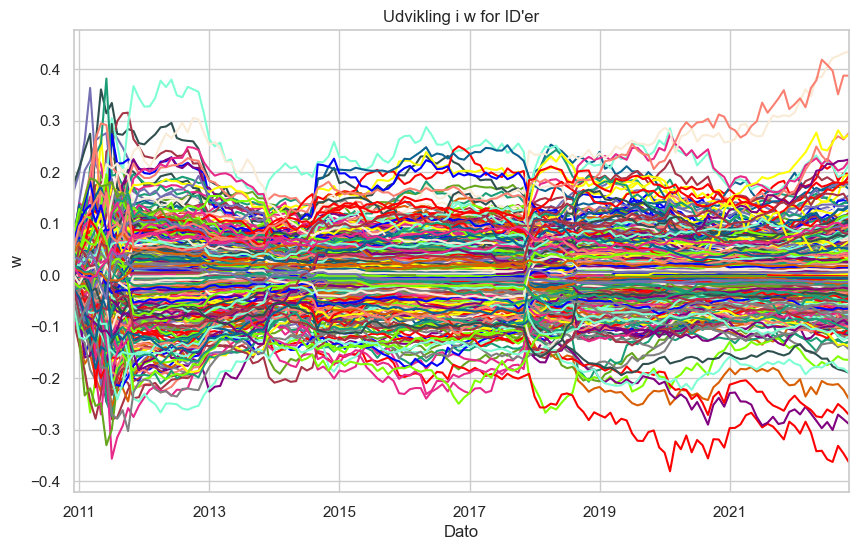

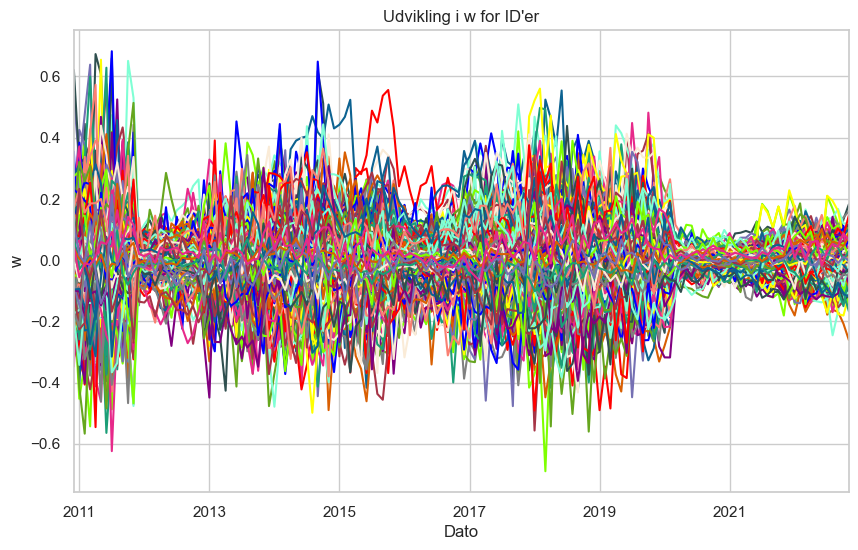

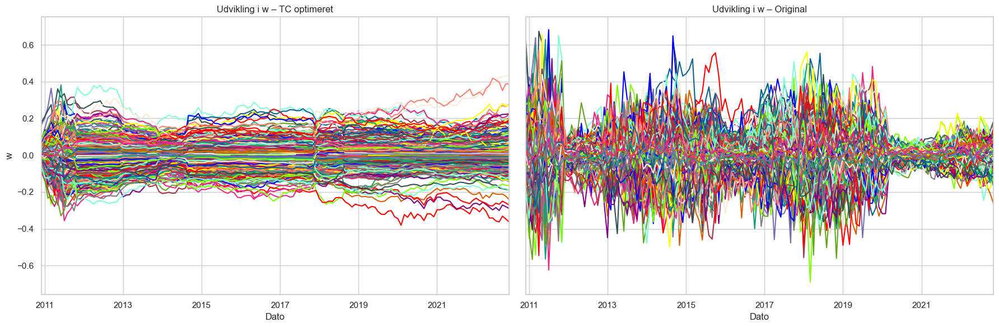

In [141]:
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col='w', show_legend=False)
plot_specific_ids(tpf_original["w"], id_list=None, weight_col='w', show_legend=False)

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot tpf_trans (optimeret)
plot_specific_ids(tpf_trans_closed["w"], id_list=None, weight_col="w", ax=axes[0], show_legend=False)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot tpf_original
plot_specific_ids(tpf_original["w"], id_list=None, weight_col="w", ax=axes[1], show_legend=False)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_MVO_ML_TC_optimeret_closed_solution"), dpi=300, bbox_inches='tight')
plt.show()


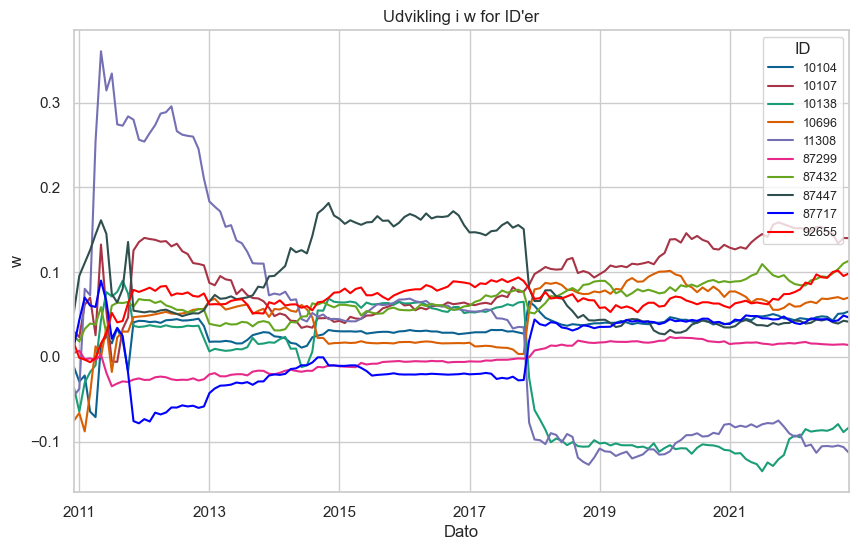

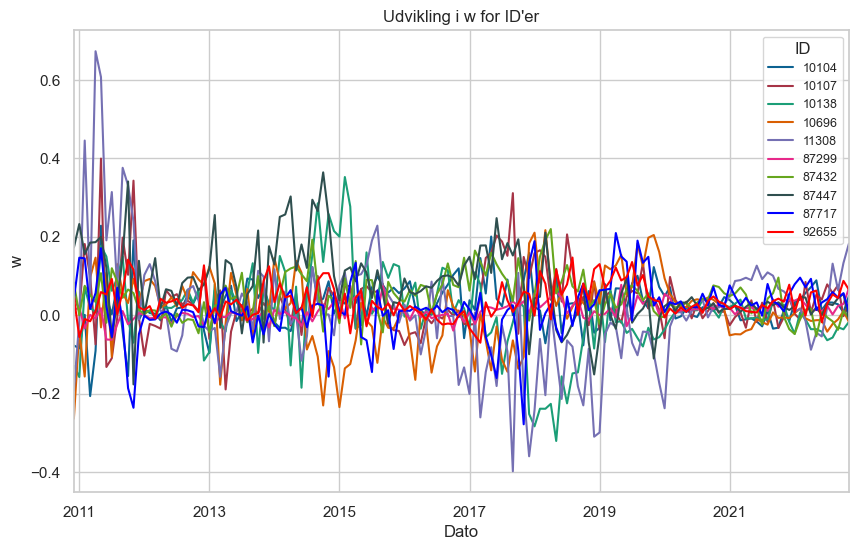

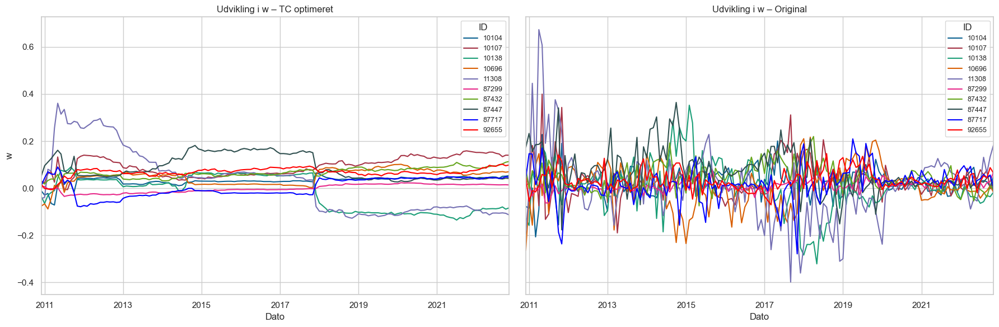

In [143]:
my_ids = [10104, 10107, 10138, 10696, 11308, 87299, 87432, 87447, 87717, 92655]
plot_specific_ids(tpf_trans_closed["w"], my_ids, weight_col='w') 
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w')  

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot TC-optimeret
plot_specific_ids(tpf_trans_closed["w"], my_ids, weight_col='w', ax=axes[0], show_legend=True)
axes[0].set_title("Udvikling i w – TC optimeret")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("w")

# Plot original
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w', ax=axes[1], show_legend=True)
axes[1].set_title("Udvikling i w – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt_udvalgte_closed_solution.png"), dpi=300, bbox_inches='tight')
plt.show()


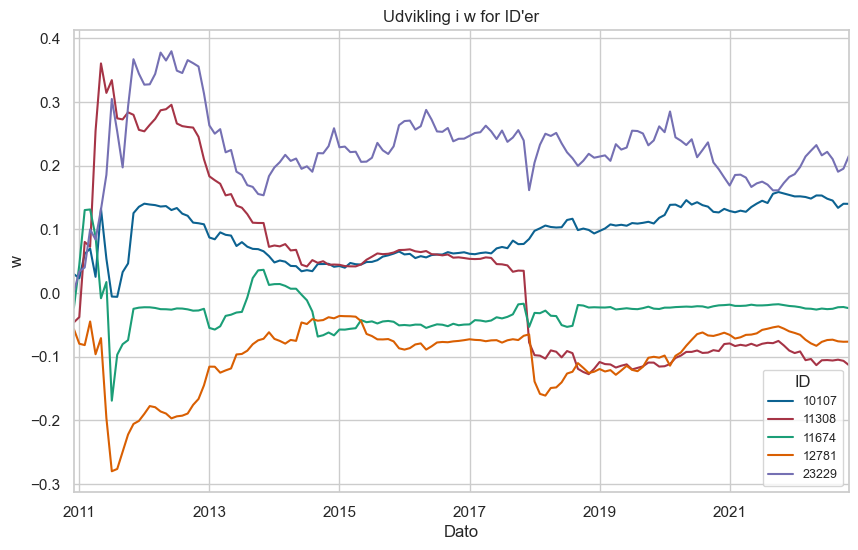

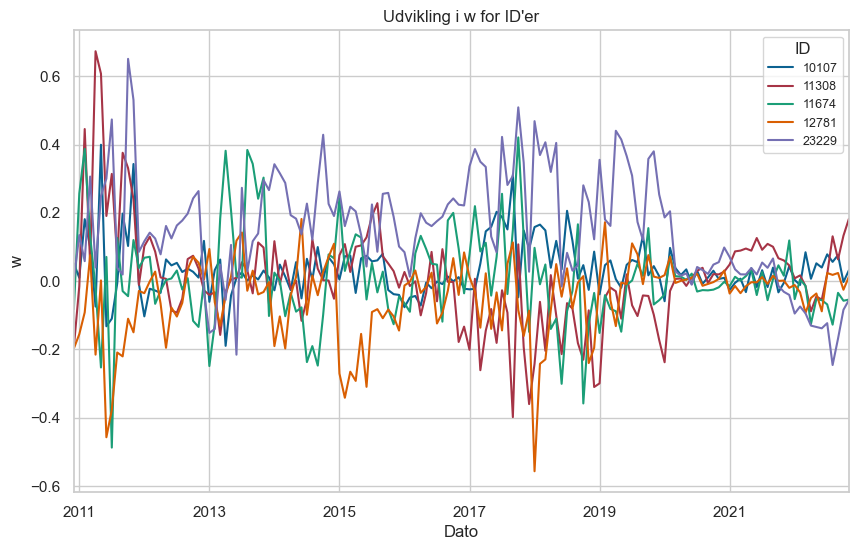

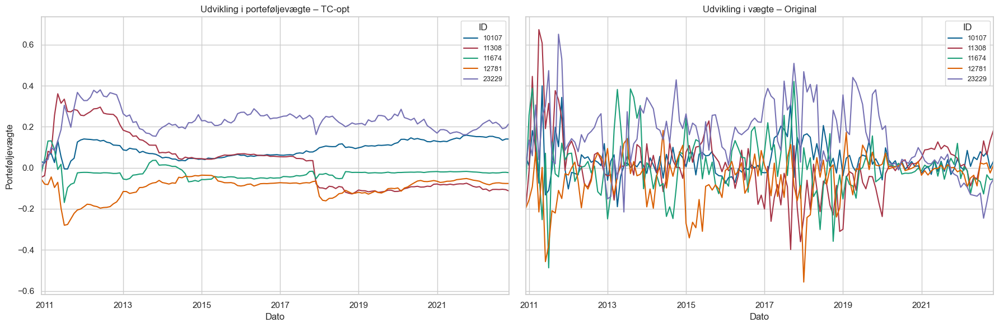

In [148]:
my_ids = [10107, 11308, 11674, 12781, 23229]
plot_specific_ids(tpf_trans_closed["w"], my_ids, weight_col='w') 
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w')  

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot TC-optimeret
plot_specific_ids(tpf_trans_closed["w"], my_ids, weight_col='w', ax=axes[0], show_legend=True)
axes[0].set_title("Udvikling i porteføljevægte – TC-opt")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("Porteføljevægte")

# Plot original
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w', ax=axes[1], show_legend=True)
axes[1].set_title("Udvikling i vægte – Original")
axes[1].set_xlabel("Dato")

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt_udvalgte_closed_solution.png"), dpi=300, bbox_inches='tight')
plt.show()


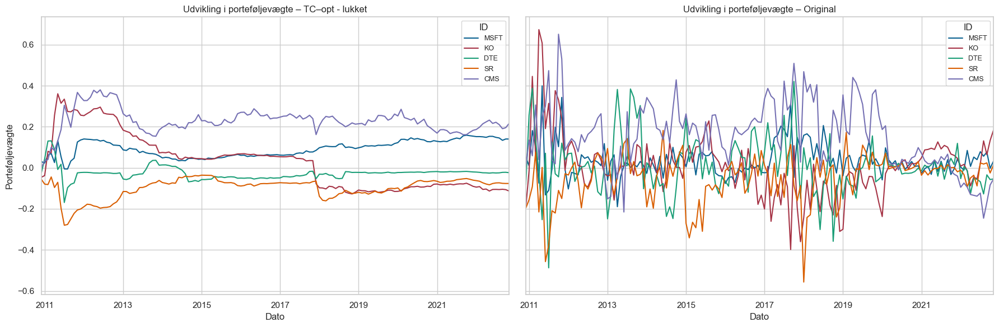

In [36]:
import matplotlib.pyplot as plt
import os

# 1) Lav din id→ticker mapping
id_to_ticker = {
    10107: 'MSFT',
    11308: 'KO',
    11674: 'DTE',
    12781: 'SR',
    23229: 'CMS'
}

my_ids = [10107, 11308, 11674, 12781, 23229]

# 2) Opsæt dine plots som før
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# TC‑opt
plot_specific_ids(tpf_trans_closed["w"], my_ids, weight_col='w', ax=axes[0], show_legend=True)
axes[0].set_title("Udvikling i porteføljevægte – TC–opt - lukket")
axes[0].set_xlabel("Dato")
axes[0].set_ylabel("Porteføljevægte")

# Original
plot_specific_ids(tpf_original["w"], my_ids, weight_col='w', ax=axes[1], show_legend=True)
axes[1].set_title("Udvikling i porteføljevægte – Original")
axes[1].set_xlabel("Dato")

# 3) Erstat legend‑labels med tickere
for ax in axes:
    leg = ax.get_legend()
    for text in leg.texts:
        orig_id = int(text.get_text())     # “10107” → 10107
        text.set_text(id_to_ticker[orig_id])

plt.tight_layout()
plt.savefig(os.path.join(output_folder, "w_udvikling_trans_opt_udvalgte_delta2_lukket_løsning.png"),
            dpi=300, bbox_inches='tight')
plt.show()


# Predictions check

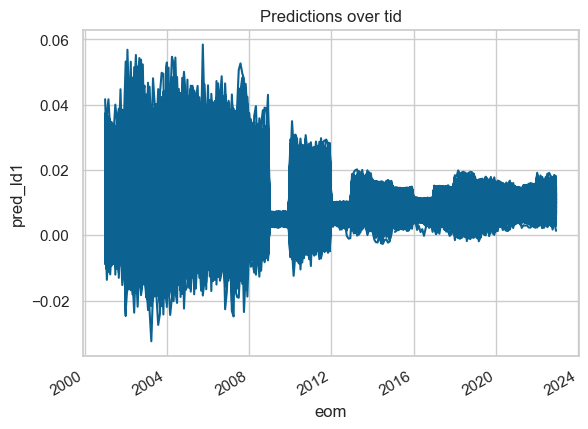

In [105]:
import pandas as pd



# Herefter kan du køre plottet:
chars['eom'] = pd.to_datetime(chars['eom'])

import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.plot(chars['eom'], chars['pred_ld1'])
ax.set_xlabel('eom')
ax.set_ylabel('pred_ld1')
ax.set_title('Predictions over tid')
fig.autofmt_xdate()
plt.show()


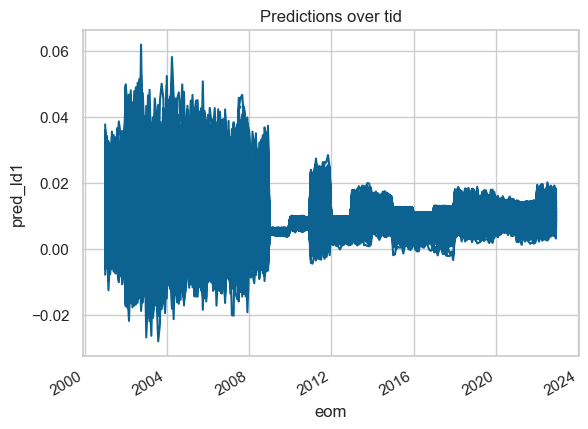

In [116]:
# seed 5
import pandas as pd



# Herefter kan du køre plottet:
chars['eom'] = pd.to_datetime(chars['eom'])

import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.plot(chars['eom'], chars['pred_ld1'])
ax.set_xlabel('eom')
ax.set_ylabel('pred_ld1')
ax.set_title('Predictions over tid')
fig.autofmt_xdate()
plt.show()
